# Harvard University Extension School
# ALM in Data Science
# CSCI E-89 Deep Learning
## Crack Detection and localization in Civil Infrastructure Using YOLOv11
### Seymur Hasanov
#### December 18, 2024

## **Executive Summary**

This project focuses on developing an automated crack detection and classification system for civil infrastructure using the YOLOv11 object detection model. The primary objective is to identify and categorize cracks into 11 distinct classes, including diagonal, horizontal, vertical cracks, and tile damage, to assist in structural health monitoring.

A dataset comprising 2159 annotated images was utilized, divided into training (1505 images), validation (422 images), and test (232 images) sets. Preprocessing techniques such as grayscale conversion, histogram equalization, and data augmentation were applied to enhance model robustness and generalization.

Multiple YOLOv11 models, including YOLOv11n (nano) and YOLOv11x (extra-large), were trained and compared. Hyperparameter tuning, such as learning rate adjustment, optimizer selection, and weight decay regularization, was performed to stabilize training and improve performance.

The results showed that:

YOLOv11x achieved the best performance with a mean Average Precision (mAP50) of 70.7% and mAP50-95 of 49.5%, demonstrating superior generalization.
Precision and recall improved steadily over training epochs, particularly for severe crack types.
Some challenges, such as misclassification of certain fine and medium cracks, remain and highlight areas for further improvement.
This project successfully demonstrates the potential of deep learning-based solutions for real-world structural health monitoring, offering a scalable and efficient tool to improve infrastructure safety and reliability for engineers and maintenance professionals.

## **Introduction**

The growing need for reliable and automated crack detection systems is essential for maintaining the safety and longevity of civil infrastructure. This project focuses on developing an efficient deep learning-based solution to detect and classify cracks in structural elements such as pavements, walls, and tiles. Leveraging the [YOLOv11](https://docs.ultralytics.com/models/yolo11/#supported-tasks-and-modes) model, known for its real-time performance and accuracy, this work aims to identify crack types categorized into 11 distinct classes.

A dataset ([Civil Faults](https://universe.roboflow.com/iiti/civil-faults-detection)) consisting of 2159 annotated images was downloaded from Roboflow and was utilized, with train, validation, and test splits prepared to ensure balanced model evaluation. Key preprocessing steps, including histogram equalization and image augmentation, were applied to enhance model robustness and performance. Hyperparameter tuning, such as learning rate adjustment and weight decay optimization, further improved detection accuracy.

By addressing the challenges of crack detection using state-of-the-art deep learning techniques, this project demonstrates a practical and scalable solution for structural health monitoring, contributing to safer infrastructure management.

### **Importing Libraries and Packages**

Essential libraries are imported to facilitate data processing and model training. Ultralytics YOLOv11n and x models are utilized for building and training the object detection model, while NumPy and OpenCV handle numerical operations and image preprocessing. Matplotlib is used for visualizing results and metrics. These tools ensure an efficient setup for image handling and deep learning tasks.

In [1]:
!pip install roboflow
!pip install -U albumentations
%pip install "ultralytics<=8.3.40" supervision roboflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.5/81.5 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.4 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.0/66.0 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 269.9/269.9 kB 11.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 632.7/632.7 kB 25.3 MB/s eta 0:00:00
  Attempting uninstall: albucore
    Found existing installation: albucore 0.0.19
    Uninstalling albucore-0.0.19:
      Successfully uninstalled albucore-0.0.19
  Attempting uninstall: albumentations
    Found existing installation: albumentations 1.4.20
    Uninstalling albumentations-1.4.20:
      Successfully uninstalled albumentations-1.4.20
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 898.5/898.5 kB 17.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [2]:
import tensorflow as tf
import ultralytics
from tensorflow import keras
import os
import matplotlib.pyplot as plt
import cv2
import albumentations as A
from albumentations.pytorch import ToTensorV2
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import glob
import pandas as pd
import seaborn as sns
from roboflow import Roboflow

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


## **Dataset Downloading and Overview**

The dataset was downloaded from ([Roboflow](https://universe.roboflow.com/iiti/civil-faults-detection)), a platform providing pre-processed and annotated datasets for machine learning tasks. Using the Roboflow API, the dataset was accessed with the following script:

In [3]:
rf = Roboflow(api_key="VJPVPFZzdmctDzTJre7S")
project = rf.workspace("iiti").project("civil-faults-detection")
version = project.version(1)
dataset = version.download("yolov11")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Civil-Faults-Detection--1 in yolov11:: 100%|██████████| 4330/4330 [00:00<00:00, 6678.96it/s]


The dataset contains 2159 images of cracks in civil structures, divided into three subsets:

* Training Set: 1505 images (70%)
* Validation Set: 422 images (20%)
* Test Set: 232 images (10%)

Each image is resized to 640x640 pixels, with auto-orientation applied during preprocessing. The dataset includes 11 classes of faults, such as diagonal, horizontal, vertical cracks, and tile damages. This structured and well-annotated dataset serves as the foundation for training and evaluating the YOLOv11 model for crack detection and classification.

The next cell counts the number of images in each subfolder (train, valid, test) and extracts unique class IDs from the label files. The images counts for each split are displayed, along with the list of detected class IDs to verify the dataset structure.

In [4]:
base_path = "./Civil-Faults-Detection--1"
splits = ['train', 'valid', 'test']
classes = set()

# Function to count files in folders
def count_images_and_classes(path):
    img_count = {}
    for split in splits:
        split_path = os.path.join(path, split, "images")
        label_path = os.path.join(path, split, "labels")

        # Count images
        num_images = len(os.listdir(split_path))
        img_count[split] = num_images

        # Gather class names from label files
        for file in os.listdir(label_path):
            with open(os.path.join(label_path, file), "r") as f:
                lines = f.readlines()
                for line in lines:
                    class_id = int(line.split()[0])
                    classes.add(class_id)

    return img_count

In [5]:
# Count images and classes
image_counts = count_images_and_classes(base_path)
print("Image counts per split:", image_counts)
print("Classes found:", sorted(classes))

Image counts per split: {'train': 1505, 'valid': 422, 'test': 232}
Classes found: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]



The next cell displays sample images from the train, valid, and test sets to analyze their visual quality and diversity.

Displaying sample images from train set:


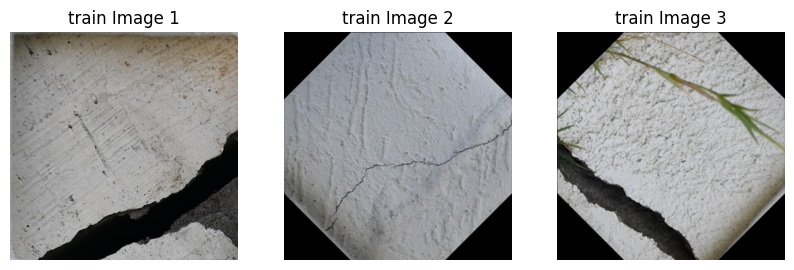

Displaying sample images from valid set:


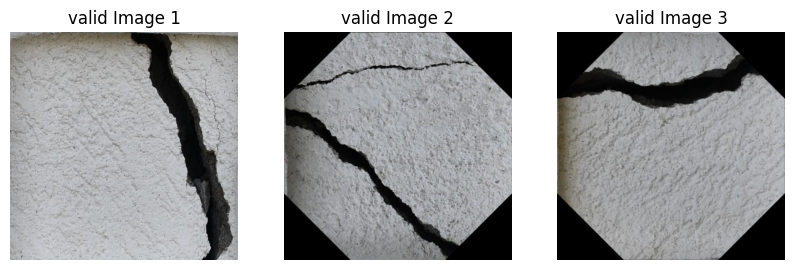

Displaying sample images from test set:


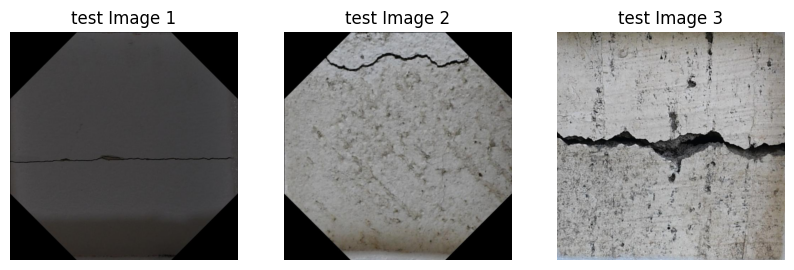

In [6]:
# Function to display sample images
def display_sample_images(path, split, num_images=3):
    img_folder = os.path.join(path, split, "images")
    images = os.listdir(img_folder)[:num_images]

    plt.figure(figsize=(10, 5))
    for i, img_name in enumerate(images):
        img_path = os.path.join(img_folder, img_name)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        plt.subplot(1, num_images, i+1)
        plt.imshow(img)
        plt.title(f"{split} Image {i+1}")
        plt.axis("off")
    plt.show()

# Display sample images for train, valid, and test
for split in splits:
    print(f"Displaying sample images from {split} set:")
    display_sample_images(base_path, split)

### Data Augmentations

Observations from the images include:

* **Shadows and Lighting Variations**: Uneven lighting and shadows can reduce the clarity of crack features.
* **Rotation and Alignment**: Some cracks appear at rotated angles, requiring alignment adjustments.
* **Background Noise**: The presence of grass, texture variations, and irregular surfaces adds complexity to the dataset.

To address these issues and enhance model robustness, data augmentation techniques are applied. The augmentations include *brightness/contrast adjustments, rotations, flips, cropping, blurring, noise addition, and resizing*. These transformations help simulate real-world variations and improve the model's generalization capabilities.

The next cell demonstrates these augmentations by applying them to a sample image, displaying the original and augmented versions for comparison.

In [7]:
# Define augmentations
augmentations = A.Compose([
    A.RandomBrightnessContrast(p=0.5),
    A.Rotate(limit=20, p=0.5),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.RandomCrop(height=256, width=256, p=0.5),
    A.GaussianBlur(blur_limit=(3, 5), p=0.3),
    A.GaussNoise(var_limit=(10.0, 50.0), p=0.3),
    A.ColorJitter(p=0.5),
    A.Perspective(scale=(0.05, 0.1), p=0.5),
    A.Resize(640, 640),
    ToTensorV2()
])

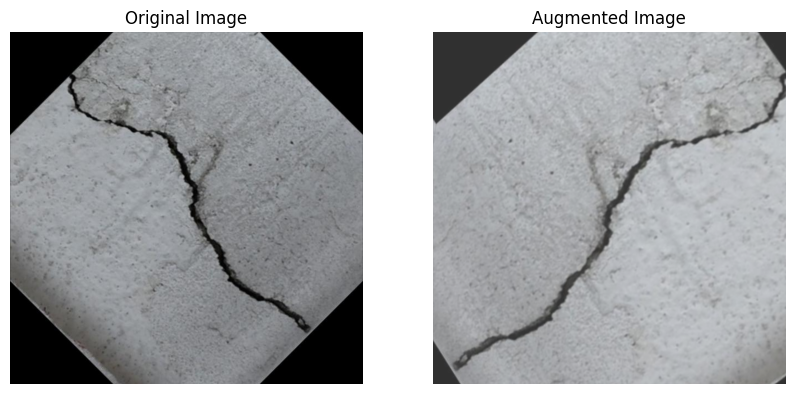

In [8]:
# Test augmentations on a sample image
image_path = "/content/Civil-Faults-Detection--1/train/images/DSC_3766rrr_jpg.rf.d21f2073bb298cfe62cb3b444d660394.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

augmented = augmentations(image=image)["image"]

fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(image)
axs[0].set_title("Original Image")
axs[0].axis("off")

axs[1].imshow(augmented.permute(1, 2, 0))
axs[1].set_title("Augmented Image")
axs[1].axis("off")

plt.show()

The augmented image shows slight rotation, a random crop focusing on a specific region, and adjustments to brightness and contrast. These transformations enhance image diversity, improving the model's ability to generalize to varying orientations, lighting conditions, and partial crack visibility.

### Equalizations

The next step applies histogram equalization to enhance image contrast, which helps address shadows and uneven lighting conditions. By converting the image to grayscale and redistributing pixel intensities, this technique highlights crack features more clearly. The function displays the original image alongside the equalized image for visual comparison. This preprocessing step ensures that important details, such as cracks, are more distinguishable for the model.

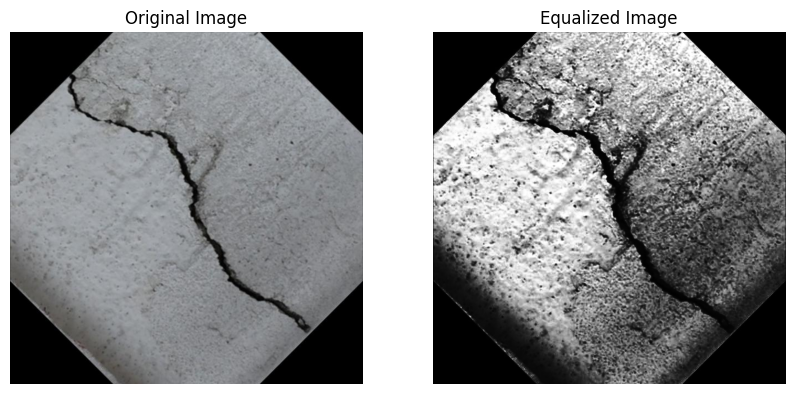

In [9]:
# Preprocessing Function: Apply Histogram Equalization
def preprocess_image(image):
    if image.dtype != np.uint8:
        image = (image * 255).clip(0, 255).astype(np.uint8)

    # Convert to grayscale
    if len(image.shape) == 3:
        image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # Apply histogram equalization
    equalized_image = cv2.equalizeHist(image)
    return equalized_image

# Function to Display Image
def display_equalized_image(image_path):

    img = cv2.imread(image_path)
    if img is None:
        raise ValueError("Error: Image not found")

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    equalized_img = preprocess_image(img_rgb)

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(img_rgb)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(equalized_img, cmap='gray')
    plt.title("Equalized Image")
    plt.axis("off")
    plt.show()

# Test on an Image
image_path = "/content/Civil-Faults-Detection--1/train/images/DSC_3766rrr_jpg.rf.d21f2073bb298cfe62cb3b444d660394.jpg"
display_equalized_image(image_path)

The next cell verifies the consistency between image and label files for each dataset split (train, valid, test). It checks for any missing images or labels and confirms that the number of images matches the number of labels. The output ensures the dataset is properly structured, with no discrepancies found.

In [10]:
# Paths to image and label directories
base_path = "./Civil-Faults-Detection--1"
splits = ['train', 'valid', 'test']

# Verify image-label pairs
for split in splits:
    images_path = os.path.join(base_path, split, "images")
    labels_path = os.path.join(base_path, split, "labels")

    image_files = sorted([f.split('.')[0] for f in os.listdir(images_path) if f.endswith('.jpg') or f.endswith('.png')])
    label_files = sorted([f.split('.')[0] for f in os.listdir(labels_path) if f.endswith('.txt')])

    missing_labels = set(image_files) - set(label_files)
    missing_images = set(label_files) - set(image_files)

    print(f"\nChecking '{split}' set:")
    print(f" - Total Images: {len(image_files)}")
    print(f" - Total Labels: {len(label_files)}")
    print(f" - Missing Labels: {len(missing_labels)} -> {missing_labels}")
    print(f" - Missing Images: {len(missing_images)} -> {missing_images}")


Checking 'train' set:
 - Total Images: 1505
 - Total Labels: 1505
 - Missing Labels: 0 -> set()
 - Missing Images: 0 -> set()

Checking 'valid' set:
 - Total Images: 422
 - Total Labels: 422
 - Missing Labels: 0 -> set()
 - Missing Images: 0 -> set()

Checking 'test' set:
 - Total Images: 232
 - Total Labels: 232
 - Missing Labels: 0 -> set()
 - Missing Images: 0 -> set()


## **Model Selection and Justification**

The project uses the **YOLOv11n** model, a lightweight variant of the YOLOv11 family, specifically chosen for its balance between **accuracy** and **efficiency**. As shown in the table below, YOLOv11n achieves a respectable **mAP50-95 of 39.5** with a speed of **56.1 ms** on CPU and **1.5 ms** on T4 GPUs, while maintaining a small model size with **2.6 million parameters** and **6.5 GFLOPs**.

### **Why YOLOv11n?**
- **Speed**: YOLOv11n provides real-time performance, making it ideal for practical applications such as crack detection in infrastructure.  
- **Efficiency**: Its low computational cost allows deployment on systems with limited hardware resources.  
- **Accuracy**: Despite being the smallest variant, YOLOv11n achieves competitive accuracy, making it suitable for the given task.

### **YOLOv11 Model Performance Comparison**

| Model     | Size (pixels) | mAP50-95 | Speed (CPU ONNX, ms) | Speed (T4 TensorRT10, ms) | Params (M) | FLOPs (B) |
|-----------|---------------|----------|-----------------------|---------------------------|------------|-----------|
| YOLO11n   | 640           | 39.5     | 56.1 ± 0.8            | 1.5 ± 0.0                 | 2.6        | 6.5       |
| YOLO11s   | 640           | 47.0     | 90.0 ± 1.2            | 2.5 ± 0.0                 | 9.4        | 21.5      |
| YOLO11m   | 640           | 51.5     | 183.2 ± 2.0           | 4.7 ± 0.1                 | 20.1       | 68.0      |
| YOLO11l   | 640           | 53.4     | 238.6 ± 1.4           | 6.2 ± 0.1                 | 25.3       | 86.9      |
| YOLO11x   | 640           | 54.7     | 462.8 ± 6.7           | 11.3 ± 0.2                | 56.9       | 194.9     |

### **Implementation Overview**

The YOLOv11n model is loaded with pre-trained weights using the following configuration:


In [11]:
ultralytics.checks()

Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Setup complete ✅ (12 CPUs, 83.5 GB RAM, 32.8/112.6 GB disk)


Load the YOLOv11 model and set up the environment.

In [12]:
from ultralytics import YOLO
model = YOLO("yolo11n.yaml").load("yolo11n.pt")  # build from YAML and transfer weights

100%|██████████| 5.35M/5.35M [00:00<00:00, 65.3MB/s]

Transferred 499/499 items from pretrained weights


### **Model Summary and Architecture**

The YOLOv11n model consists of **319 layers**, **2.6 million parameters**, and requires **6.6 GFLOPs**, as shown in the following output:


The architecture is divided into three main components:  

1. **Backbone**: Extracts multi-scale features using **Conv** layers and **C3K2 blocks**.  
2. **Neck**: Enhances feature fusion with **SPPF** and **C2PSA** blocks, combining upsampled feature maps.  
3. **Head**: Detects and classifies objects at multiple scales using optimized **Detect** layers.  

This design achieves a balance between computational efficiency and detection accuracy, making YOLOv11n ideal for real-time applications.  

### **YOLOv11 Architecture**

The figure below illustrates the [YOLOv11 architecture](https://medium.com/@nikhil-rao-20/yolov11-explained-next-level-object-detection-with-enhanced-speed-and-accuracy-2dbe2d376f71), showing the **Backbone**, **Neck**, and **Head** components.

![YOLOv11 Architecture](https://drive.google.com/uc?id=16ZGU2tuJyyrRDUh2KTYhlgnBAerdJz3V)

In [13]:
model.info()

YOLO11n summary: 319 layers, 2,624,080 parameters, 2,624,064 gradients, 6.6 GFLOPs


(319, 2624080, 2624064, 6.614336)

### **Model Training**

The training process uses the following configurations:

- **Dataset**: `/content/Civil-Faults-Detection--1/data.yaml`  
- **Epochs**: 50  
- **Image Size**: 640x640 pixels  
- **Optimizer**: AdamW (automatically determined)  
- **Learning Rate**: Adjusted dynamically (initial `lr0=0.01`)  
- **Batch Size**: 16  
- **Patience**: 10 epochs for early stopping  
- **Augmentations**: Built-in augmentations such as flipping, CLAHE, blur, and color jittering.  

### **YAML File Overview**

The **YAML file** provides the YOLO model with essential configuration details, including paths to the training, validation, and test datasets, the number of classes (`nc`), and class names. It ensures the model can locate the dataset and interpret the class labels correctly, enabling seamless training and evaluation.  


The training command is as follows:



In [14]:
# Train the model
results = model.train(
    data="/content/Civil-Faults-Detection--1/data.yaml",
    epochs=50,
    imgsz=640,
    plots=True,
    patience=10
)

New https://pypi.org/project/ultralytics/8.3.51 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.yaml, data=/content/Civil-Faults-Detection--1/data.yaml, epochs=50, time=None, patience=10, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=yolo11n.pt, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False

100%|██████████| 755k/755k [00:00<00:00, 14.9MB/s]


Overriding model.yaml nc=80 with nc=11

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytic

train: Scanning /content/Civil-Faults-Detection--1/train/labels... 1505 images, 15 backgrounds, 0 corrupt: 100%|██████████| 1505/1505 [00:01<00:00, 1010.15it/s]

train: New cache created: /content/Civil-Faults-Detection--1/train/labels.cache
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 1744, len(boxes) = 1791. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/Civil-Faults-Detection--1/valid/labels... 422 images, 8 backgrounds, 0 corrupt: 100%|██████████| 422/422 [00:00<00:00, 817.15it/s]


val: New cache created: /content/Civil-Faults-Detection--1/valid/labels.cache
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 503, len(boxes) = 511. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000667, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      2.64G      1.413      3.907      1.624          2        640: 100%|██████████| 95/95 [00:13<00:00,  7.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  3.77it/s]


                   all        422        511      0.705      0.257      0.292      0.164

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      2.63G      1.375      2.897      1.534          4        640: 100%|██████████| 95/95 [00:10<00:00,  8.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.97it/s]

                   all        422        511      0.358      0.461      0.349      0.176



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      2.63G      1.385      2.598      1.537          1        640: 100%|██████████| 95/95 [00:10<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.41it/s]


                   all        422        511      0.502      0.443       0.42      0.201

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      2.63G      1.338      2.338      1.505          2        640: 100%|██████████| 95/95 [00:10<00:00,  8.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.88it/s]


                   all        422        511      0.526      0.495      0.458      0.239

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.63G      1.282      2.231      1.458          0        640: 100%|██████████| 95/95 [00:10<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.73it/s]


                   all        422        511      0.549      0.492       0.51      0.268

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      2.64G      1.264      2.052      1.447          3        640: 100%|██████████| 95/95 [00:10<00:00,  8.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.89it/s]


                   all        422        511       0.52      0.529      0.513      0.292

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      2.63G      1.241      1.872      1.418          4        640: 100%|██████████| 95/95 [00:10<00:00,  9.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.60it/s]

                   all        422        511      0.628      0.559      0.591      0.328



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      2.63G      1.226      1.828      1.416          1        640: 100%|██████████| 95/95 [00:10<00:00,  9.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.87it/s]


                   all        422        511       0.59      0.573      0.585      0.333

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      2.64G      1.218      1.728      1.408          3        640: 100%|██████████| 95/95 [00:10<00:00,  8.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  8.03it/s]


                   all        422        511      0.516      0.553      0.558      0.323

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      2.64G      1.206      1.737      1.393          4        640: 100%|██████████| 95/95 [00:10<00:00,  8.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  8.09it/s]


                   all        422        511      0.681      0.618      0.636      0.393

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      2.63G      1.144      1.637      1.354          3        640: 100%|██████████| 95/95 [00:10<00:00,  8.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.92it/s]


                   all        422        511      0.548      0.619      0.588      0.357

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      2.63G      1.155        1.6      1.347          2        640: 100%|██████████| 95/95 [00:10<00:00,  9.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.97it/s]

                   all        422        511      0.666      0.622      0.632      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      2.62G      1.152      1.591      1.377          1        640: 100%|██████████| 95/95 [00:10<00:00,  9.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.87it/s]

                   all        422        511      0.643      0.586      0.606      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      2.64G      1.153       1.55      1.354          3        640: 100%|██████████| 95/95 [00:10<00:00,  8.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  8.16it/s]


                   all        422        511      0.735      0.567       0.64      0.396

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      2.65G      1.128      1.493      1.343          3        640: 100%|██████████| 95/95 [00:10<00:00,  8.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  8.13it/s]


                   all        422        511      0.612      0.599      0.603      0.361

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      2.62G      1.103      1.448      1.334          4        640: 100%|██████████| 95/95 [00:10<00:00,  8.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.86it/s]


                   all        422        511      0.574      0.625      0.603       0.38

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      2.64G      1.093      1.432      1.325          5        640: 100%|██████████| 95/95 [00:10<00:00,  9.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.97it/s]


                   all        422        511       0.62      0.644      0.627      0.389

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      2.63G      1.092      1.438      1.341          2        640: 100%|██████████| 95/95 [00:10<00:00,  9.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.96it/s]


                   all        422        511      0.635      0.672      0.669      0.423

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      2.63G      1.085       1.38      1.327          1        640: 100%|██████████| 95/95 [00:10<00:00,  8.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  8.11it/s]


                   all        422        511      0.714      0.635      0.654      0.413

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      2.64G      1.044      1.341      1.276          4        640: 100%|██████████| 95/95 [00:10<00:00,  8.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  8.20it/s]


                   all        422        511      0.695      0.635      0.656      0.422

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      2.62G      1.067      1.302      1.298          1        640: 100%|██████████| 95/95 [00:10<00:00,  8.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  8.12it/s]

                   all        422        511      0.648      0.688      0.655      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      2.63G      1.039       1.33      1.291          5        640: 100%|██████████| 95/95 [00:10<00:00,  9.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  8.07it/s]


                   all        422        511      0.692      0.647      0.671      0.421

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      2.63G      1.069      1.313      1.306          1        640: 100%|██████████| 95/95 [00:10<00:00,  9.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  8.17it/s]


                   all        422        511      0.706      0.632      0.675      0.426

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      2.64G      1.025      1.276      1.274          4        640: 100%|██████████| 95/95 [00:10<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  8.13it/s]


                   all        422        511        0.7      0.639      0.661      0.428

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      2.62G      1.057      1.303      1.287          6        640: 100%|██████████| 95/95 [00:10<00:00,  8.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  8.03it/s]


                   all        422        511      0.619      0.668      0.668      0.443

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      2.63G      1.019      1.269      1.266          2        640: 100%|██████████| 95/95 [00:10<00:00,  8.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.88it/s]

                   all        422        511      0.699      0.654      0.672      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      2.63G      1.019      1.256      1.265          4        640: 100%|██████████| 95/95 [00:10<00:00,  9.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.60it/s]


                   all        422        511      0.689       0.63      0.655      0.424

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      2.64G      1.011      1.212      1.252          1        640: 100%|██████████| 95/95 [00:10<00:00,  9.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  8.14it/s]


                   all        422        511      0.701      0.685      0.684      0.442

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      2.62G      1.008      1.248      1.252          2        640: 100%|██████████| 95/95 [00:10<00:00,  8.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  8.24it/s]

                   all        422        511      0.689      0.657      0.684      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      2.63G     0.9778      1.181      1.239          4        640: 100%|██████████| 95/95 [00:10<00:00,  8.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  8.31it/s]

                   all        422        511      0.733      0.659      0.671      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      2.64G     0.9909      1.156      1.244          4        640: 100%|██████████| 95/95 [00:10<00:00,  8.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  8.02it/s]


                   all        422        511      0.695      0.708      0.699      0.466

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      2.64G     0.9539       1.19      1.218          2        640: 100%|██████████| 95/95 [00:10<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.93it/s]


                   all        422        511      0.712      0.658      0.676      0.456

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      2.64G     0.9468      1.151      1.222          1        640: 100%|██████████| 95/95 [00:10<00:00,  9.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  8.33it/s]

                   all        422        511      0.691      0.684      0.691      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      2.63G     0.9894      1.198      1.266          1        640: 100%|██████████| 95/95 [00:10<00:00,  8.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  8.06it/s]


                   all        422        511      0.678      0.678      0.668      0.446

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      2.64G     0.9618      1.175      1.232          1        640: 100%|██████████| 95/95 [00:10<00:00,  8.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  8.07it/s]


                   all        422        511      0.664      0.703      0.693      0.469

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      2.64G     0.9296      1.104      1.216          1        640: 100%|██████████| 95/95 [00:10<00:00,  8.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.90it/s]


                   all        422        511      0.716      0.692      0.703      0.461

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      2.64G      0.934      1.131      1.224          4        640: 100%|██████████| 95/95 [00:10<00:00,  8.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  8.16it/s]


                   all        422        511      0.677      0.719      0.688      0.459

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      2.63G     0.9295      1.106      1.213          2        640: 100%|██████████| 95/95 [00:10<00:00,  9.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  8.32it/s]

                   all        422        511      0.689       0.68      0.694      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      2.64G     0.9429      1.093       1.22          2        640: 100%|██████████| 95/95 [00:10<00:00,  8.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  8.27it/s]


                   all        422        511      0.728      0.694      0.705       0.48

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      2.64G     0.9172      1.119      1.207          3        640: 100%|██████████| 95/95 [00:10<00:00,  8.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  8.23it/s]

                   all        422        511      0.745      0.699       0.71      0.486


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      2.63G     0.8494     0.9958      1.253          1        640: 100%|██████████| 95/95 [00:11<00:00,  8.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.59it/s]

                   all        422        511      0.639      0.712       0.68      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      2.62G     0.8113     0.8989      1.198          1        640: 100%|██████████| 95/95 [00:10<00:00,  9.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  8.20it/s]


                   all        422        511      0.755      0.678      0.706      0.489

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      2.61G     0.7995     0.8861      1.189          0        640: 100%|██████████| 95/95 [00:10<00:00,  9.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.99it/s]


                   all        422        511      0.741      0.693      0.699      0.489

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      2.64G     0.8123      0.883      1.195          2        640: 100%|██████████| 95/95 [00:10<00:00,  9.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  8.21it/s]

                   all        422        511      0.738       0.69      0.705      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50       2.6G     0.7694     0.8425      1.172          1        640: 100%|██████████| 95/95 [00:10<00:00,  9.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  8.28it/s]


                   all        422        511      0.733      0.692      0.696      0.484

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      2.63G     0.7832      0.853      1.193          1        640: 100%|██████████| 95/95 [00:10<00:00,  8.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  8.06it/s]

                   all        422        511      0.722      0.703      0.698      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      2.61G     0.7796     0.8167      1.164          1        640: 100%|██████████| 95/95 [00:10<00:00,  9.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  8.18it/s]

                   all        422        511       0.75      0.698      0.707      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      2.61G     0.7316     0.7842      1.144          1        640: 100%|██████████| 95/95 [00:10<00:00,  9.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  8.28it/s]

                   all        422        511      0.741      0.702      0.701      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50       2.6G     0.7751     0.8312      1.179          1        640: 100%|██████████| 95/95 [00:10<00:00,  9.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  8.30it/s]

                   all        422        511      0.748      0.688      0.699      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      2.62G     0.7573     0.8017      1.161          2        640: 100%|██████████| 95/95 [00:10<00:00,  8.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  8.39it/s]


                   all        422        511      0.732      0.705      0.701      0.494

50 epochs completed in 0.184 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.5MB

Validating runs/detect/train/weights/best.pt...
WARNING ⚠️ validating an untrained model YAML will result in 0 mAP.
Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
YOLO11n summary (fused): 238 layers, 2,584,297 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  5.42it/s]


                   all        422        511       0.75      0.698      0.707      0.495
   Diagonal_Fine_Crack         68         69      0.785      0.855      0.804      0.615
 Diagonal_Medium_Crack         42         50      0.673       0.66      0.631      0.518
 Diagonal_Severe_Crack         78         78      0.911      0.897      0.927      0.845
 Horizontal_Fine_Crack         31         37      0.768      0.626      0.626       0.38
Horizontal_Medium_Crack         15         18      0.583      0.389      0.471      0.284
Horizontal_Severe_Crack         50         51      0.819      0.889      0.821      0.607
        Pavement_Crack         12         44      0.653      0.659      0.717      0.368
           Tile_Damage         27         32      0.899      0.835      0.885      0.529
   Vertical_Fine_Crack         37         52      0.628      0.486      0.516      0.315
 Vertical_Medium_Crack         24         32      0.645      0.406      0.425      0.235
 Vertical_Severe_Cr

### **Training Results**

The initial training run of the **YOLOv11n** model was completed successfully with **50 epochs** using the provided dataset. Key observations and performance metrics are as follows:

- **Final mAP50**: **70.7%**  
- **Final mAP50-95**: **49.5%**  
- **Precision**: **75.0%**  
- **Recall**: **69.8%**  

### **Class-wise Performance**
| Class                     | Precision | Recall | mAP50 | mAP50-95 |
|---------------------------|-----------|--------|-------|----------|
| Diagonal_Fine_Crack       | 78.5%     | 85.5%  | 80.4% | 61.5%    |
| Diagonal_Medium_Crack     | 67.3%     | 66.0%  | 63.1% | 51.8%    |
| Diagonal_Severe_Crack     | 91.1%     | 89.7%  | 92.7% | 84.5%    |
| Horizontal_Fine_Crack     | 76.8%     | 62.6%  | 62.6% | 38.0%    |
| Horizontal_Medium_Crack   | 58.3%     | 38.9%  | 47.1% | 28.4%    |
| Horizontal_Severe_Crack   | 81.9%     | 88.9%  | 82.1% | 60.7%    |
| Pavement_Crack            | 65.3%     | 65.9%  | 71.7% | 36.8%    |
| Tile_Damage               | 89.9%     | 83.5%  | 88.5% | 52.9%    |
| Vertical_Fine_Crack       | 62.8%     | 48.6%  | 51.6% | 31.5%    |
| Vertical_Medium_Crack     | 64.5%     | 40.6%  | 42.5% | 23.5%    |
| Vertical_Severe_Crack     | 89.1%     | 97.9%  | 95.1% | 74.6%    |

### **Key Observations**
1. **High-performing Classes**:  
   - 'Diagonal_Severe_Crack' and 'Vertical_Severe_Crack' achieved the highest mAP scores with **92.7%** and **95.1%**, respectively.  
   - 'Tile_Damage' also performed well with an mAP50 of **88.5%**.  

2. **Low-performing Classes**:  
   - 'Horizontal_Medium_Crack' and 'Vertical_Medium_Crack' showed lower recall and mAP scores, indicating the need for improved data representation or augmentation.  

3. **Loss Trends**:  
   - Box loss, class loss, and DFL loss decreased steadily over the epochs, confirming stable training.  



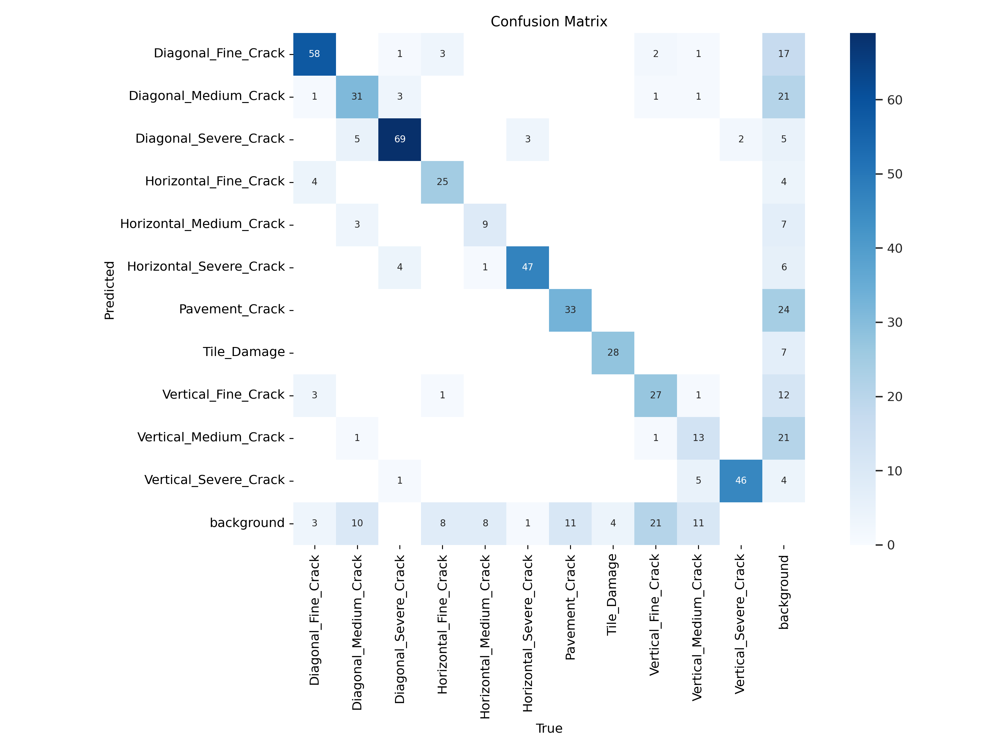

In [18]:
from IPython.display import Image as IPyImage

IPyImage(filename=f'/content/runs/detect/train/confusion_matrix.png', width=800)

### **Confusion Matrix Analysis**  

The confusion matrix shows strong performance for classes like **Diagonal_Severe_Crack** and **Horizontal_Severe_Crack** with high correct predictions. Misclassifications occur primarily in **Diagonal_Fine_Crack** and **Vertical_Fine_Crack**, often confused with similar classes or background. Background misclassification highlights the need for better preprocessing and class balancing.  

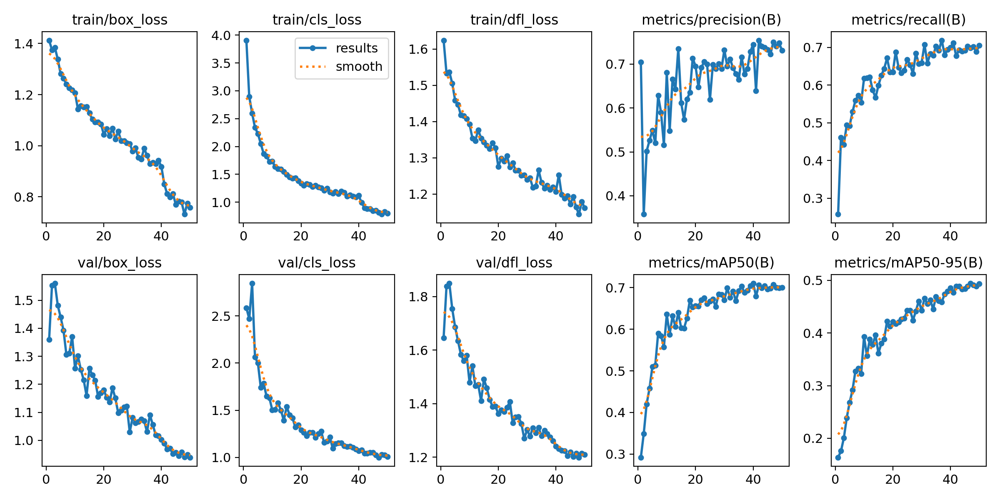

In [19]:
IPyImage(filename=f'/content/runs/detect/train/results.png', width=800)

### **Training and Validation Metrics Analysis**

The training and validation curves show the following trends:  

1. **Loss Curves**:  
   - **Box, class, and DFL losses** decrease steadily for both training and validation, indicating successful convergence.  
   - Validation loss aligns closely with training loss, suggesting minimal overfitting.  

2. **Precision and Recall**:  
   - Precision and recall improve consistently across epochs, reaching stable values above **70%**.  

3. **mAP Metrics**:  
   - **mAP50** increases steadily and stabilizes around **70%**.  
   - **mAP50-95** improves gradually, reaching approximately **50%**.  

These results confirm a stable and well-converged model, with potential for further improvement through hyperparameter tuning and augmentation adjustments.


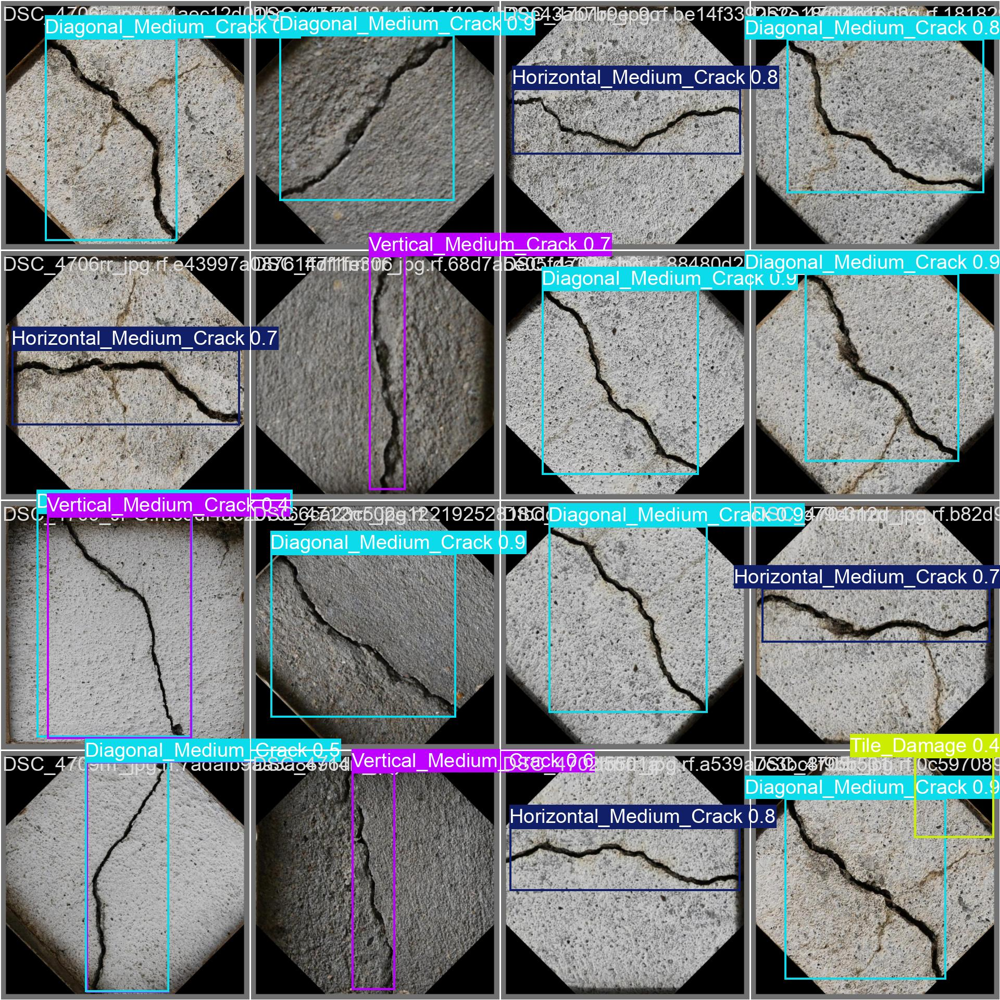

In [28]:
IPyImage(filename=f'/content/runs/detect/train/val_batch0_pred.jpg', width=600)

### **Model Validation**

Validation is performed to evaluate the model's performance on unseen data, ensuring its generalization ability and identifying areas for improvement.  

In [30]:
from ultralytics import YOLO

# Load the trained YOLO model
model = YOLO('/content/runs/detect/train/weights/best.pt')  # Update path if necessary

# Perform validation
results = model.val(data='/content/Civil-Faults-Detection--1/data.yaml')

Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
YOLO11n summary (fused): 238 layers, 2,584,297 parameters, 0 gradients, 6.3 GFLOPs


val: Scanning /content/Civil-Faults-Detection--1/valid/labels.cache... 422 images, 8 backgrounds, 0 corrupt: 100%|██████████| 422/422 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 503, len(boxes) = 511. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 27/27 [00:03<00:00,  8.39it/s]


                   all        422        511      0.719      0.719      0.703      0.492
   Diagonal_Fine_Crack         68         69      0.789      0.855      0.863      0.669
 Diagonal_Medium_Crack         42         50      0.769       0.68        0.7      0.555
 Diagonal_Severe_Crack         78         78      0.879      0.932      0.916      0.847
 Horizontal_Fine_Crack         31         37      0.741      0.676      0.622      0.349
Horizontal_Medium_Crack         15         18      0.543        0.5      0.523      0.298
Horizontal_Severe_Crack         50         51      0.808      0.922      0.854      0.639
        Pavement_Crack         12         44      0.723      0.593      0.648      0.285
           Tile_Damage         27         32      0.787      0.807      0.815      0.486
   Vertical_Fine_Crack         37         52      0.566      0.527      0.518      0.294
 Vertical_Medium_Crack         24         32      0.416      0.469      0.336      0.213
 Vertical_Severe_Cr

Validation Results

* Overall mAP50: 70.3%
* Overall mAP50-95: 49.2%

Top-performing Classes:
* Diagonal_Severe_Crack (mAP50: 91.6%)
* Vertical_Severe_Crack (mAP50: 94.2%).

Challenging Classes:

Vertical_Medium_Crack and Horizontal_Medium_Crack show lower mAP scores, requiring further data augmentation or balancing.

## Inference with custom model

In [20]:
# Load the trained YOLO model
model_path = "/content/runs/detect/train/weights/best.pt"
model = YOLO(model_path)

# Run prediction
results = model.predict(
    source="/content/Civil-Faults-Detection--1/test/images",
    conf=0.2,
    save=True,
    project="results",
    name="predictions",
    verbose=False
    )

Results saved to results/predictions


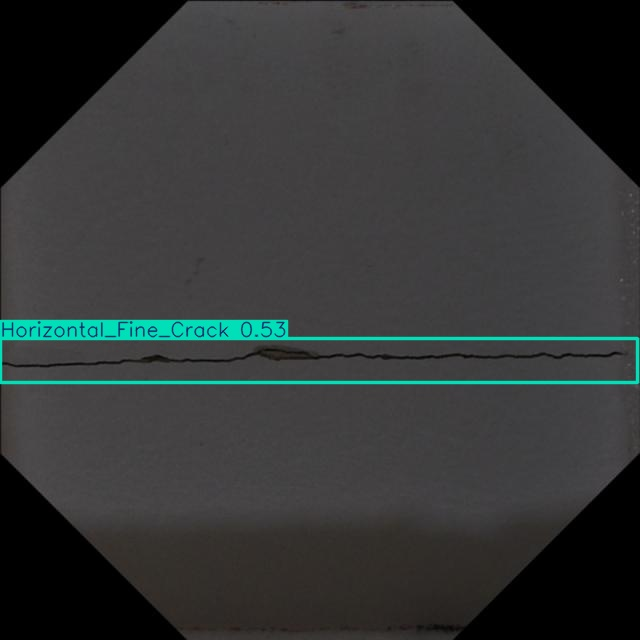

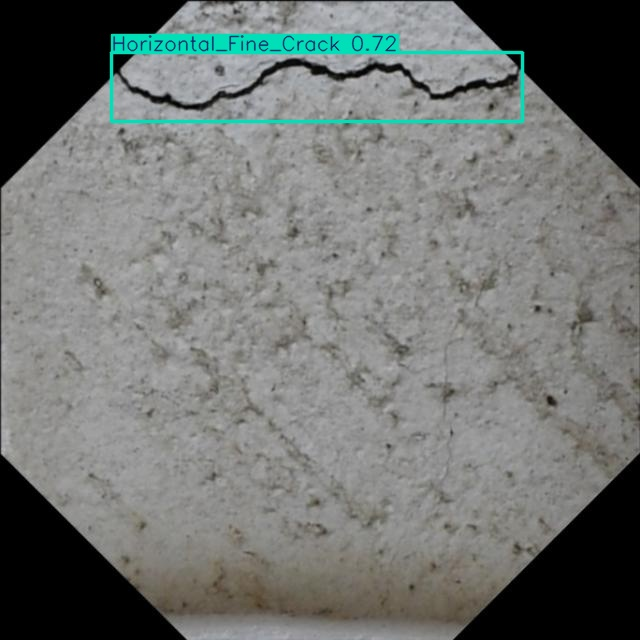

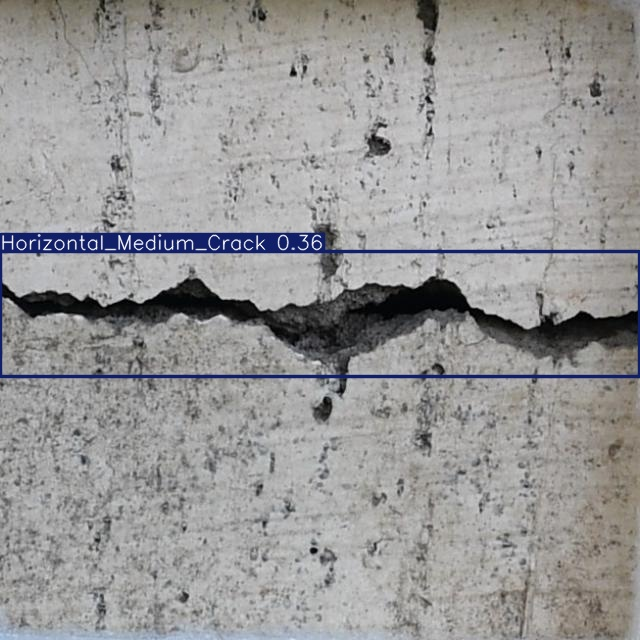

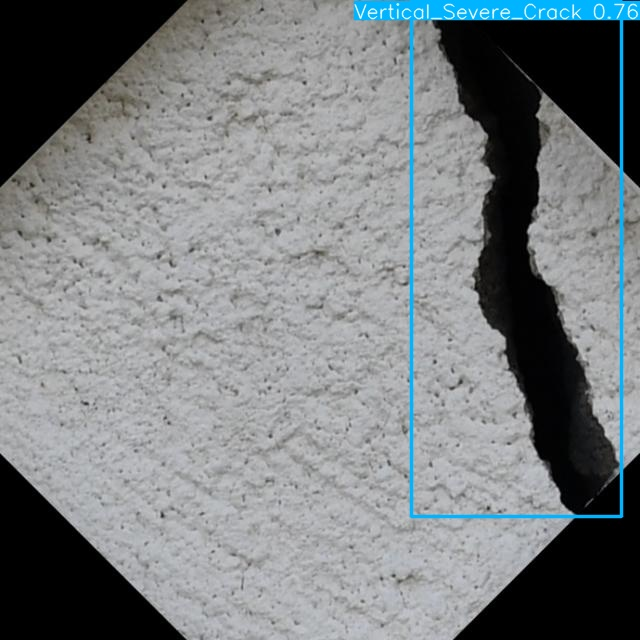

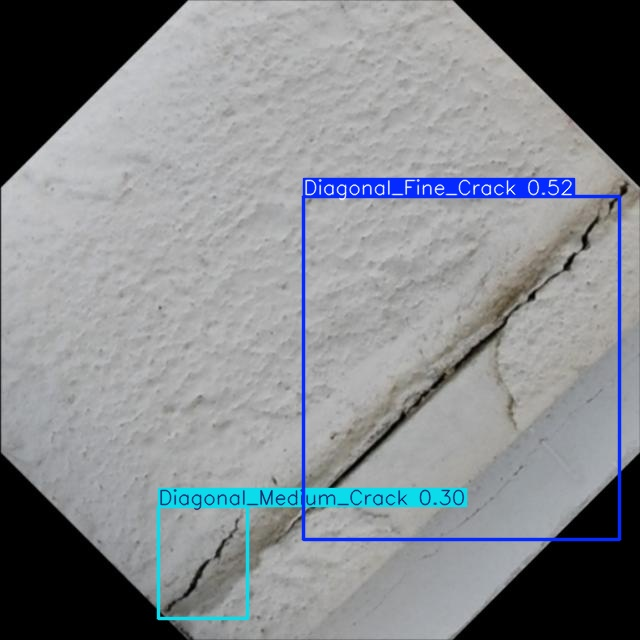

In [21]:
from IPython.display import Image as IPyImage, display

latest_folder = "/content/results/predictions"

if os.path.exists(latest_folder):
    image_files = glob.glob(f"{latest_folder}/*.jpg")
    if image_files:
        # Display up to 5 predicted images
        for img in image_files[:5]:
            display(IPyImage(filename=img, width=300))
            print("\n")
    else:
        print("No images found in the predictions folder.")
else:
    print("Predictions folder does not exist. Check the path.")


### **Inference Results**

The model successfully detects and classifies cracks in the test images. Predictions include bounding boxes and confidence scores for the detected crack types.

1. **Accurate Detections**:  
   - Classes such as **Horizontal_Medium_Crack**, **Vertical_Severe_Crack**, and **Diagonal_Fine_Crack** are identified with high confidence.  

2. **Confidence Scores**:  
   - Predictions vary in confidence, indicating areas for improvement, particularly for less confident detections like **Diagonal_Medium_Crack** (0.30).  

3. **Bounding Box Quality**:  
   - Bounding boxes closely align with visible cracks, confirming the model's ability to localize and classify cracks effectively.  



In [22]:
# access the drive first
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [23]:
%load_ext tensorboard
%tensorboard --logdir /content/runs

<IPython.core.display.Javascript object>

### **Loss Functions in YOLOv11**  

1. **Box Loss**:  
   Measures the error in predicting the coordinates of the bounding boxes (x, y, width, height). It ensures the predicted boxes align closely with the ground truth.  

2. **Class Loss**:  
   Calculates the error in classifying the detected object into its correct category. It focuses on improving classification accuracy for each bounding box.  

3. **DFL Loss (Distribution Focal Loss)**:  
   A loss function that improves the precision of bounding box regression by predicting distributions over box coordinates rather than single values, enhancing localization accuracy.  

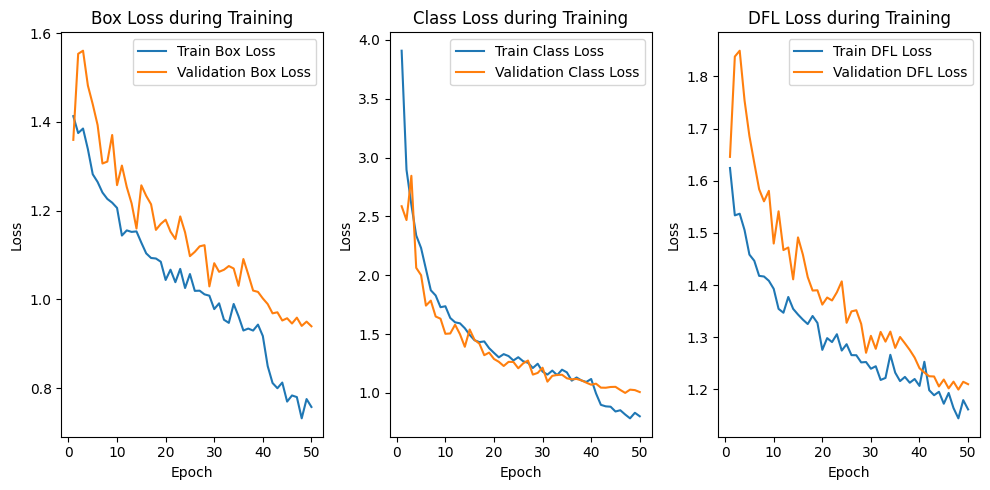

In [24]:
import pandas as pd
results_path = '/content/runs/detect/train/results.csv'
df = pd.read_csv(results_path)

df.columns = df.columns.str.strip()
plt.figure(figsize=(10, 5))

plt.subplot(1, 3, 1)
plt.plot(df['epoch'], df['train/box_loss'], label='Train Box Loss')
plt.plot(df['epoch'], df['val/box_loss'], label='Validation Box Loss')
plt.title('Box Loss during Training')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(df['epoch'], df['train/cls_loss'], label='Train Class Loss')
plt.plot(df['epoch'], df['val/cls_loss'], label='Validation Class Loss')
plt.title('Class Loss during Training')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 3, 3)
plt.plot(df['epoch'], df['train/dfl_loss'], label='Train DFL Loss')
plt.plot(df['epoch'], df['val/dfl_loss'], label='Validation DFL Loss')
plt.title('DFL Loss during Training')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

### **Training Loss Analysis**

The graphs show the progression of **box loss**, **class loss**, and **DFL loss** for both training and validation:  

- **Box Loss**: Decreases steadily, with validation loss stabilizing slightly higher than training, indicating minor overfitting.  
- **Class Loss**: Both curves converge closely, suggesting consistent classification learning.  
- **DFL Loss**: Similar trends with slight gaps, indicating room for further optimization.  

Overall, the model demonstrates stable training with minor overfitting, which can be addressed through regularization or augmentation.


### **Precision and Recall**  

- **Precision**: The proportion of correctly predicted positive instances out of all predicted positives. It measures how accurate the model's predictions are.  
   - *Formula*: `Precision = True Positives / (True Positives + False Positives)`  

- **Recall**: The proportion of correctly predicted positive instances out of all actual positives. It measures the model's ability to identify all relevant instances.  
   - *Formula*: `Recall = True Positives / (True Positives + False Negatives)`  

In simpler terms, precision focuses on **accuracy**, while recall focuses on **completeness** of the predictions.

Precision and recall show steady improvement over epochs. Precision stabilizes around **72-75%**, while recall reaches approximately **71%**, indicating balanced performance in detecting and classifying cracks.

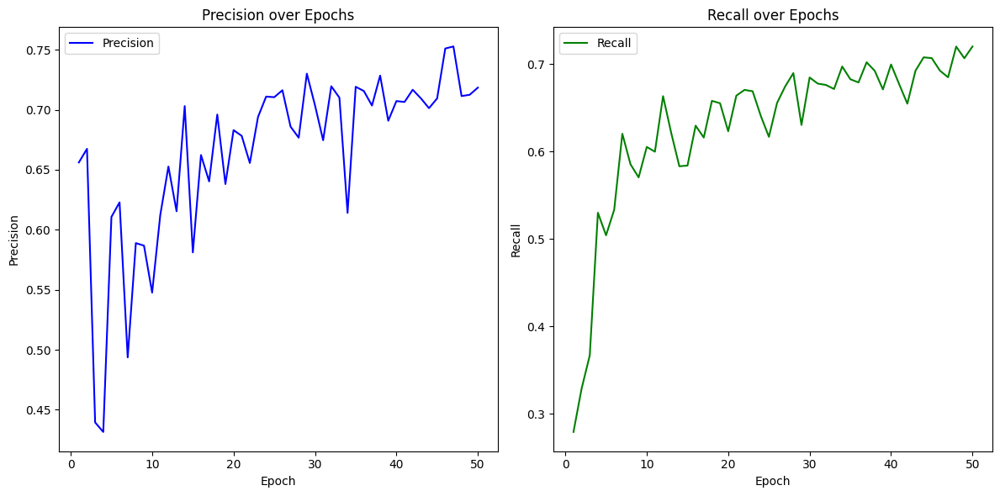

In [34]:
# Plotting Precision and Recall
plt.figure(figsize=(12, 6))

# Plotting Precision
plt.subplot(1, 2, 1)
plt.plot(df['epoch'], df['metrics/precision(B)'], label='Precision', color='blue')
plt.title('Precision over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Precision')
plt.legend()

# Plotting Recall
plt.subplot(1, 2, 2)
plt.plot(df['epoch'], df['metrics/recall(B)'], label='Recall', color='green')
plt.title('Recall over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Recall')
plt.legend()

plt.tight_layout()
plt.show()


### **Hyperparameter Adjustments**  

1. **Learning Rate**:  
   - Reduced the initial learning rate to **0.0005** to control training dynamics and prevent overshooting during optimization.  

2. **Optimizer**:  
   - Changed the optimizer to **SGD** for better handling of weight decay and stable convergence on complex datasets.  

4. **Weight Decay**:  
   - Set weight decay to **0.0005** to prevent overfitting by penalizing large weights, improving generalization on unseen data.  

These adjustments aim to optimize training performance, enhance stability, and refine the model’s ability to detect nuanced features in crack images.


In [27]:
from ultralytics import YOLO

model = YOLO('/content/yolo11n.pt')

# Train the model
model.train(
    data='/content/Civil-Faults-Detection--1/data.yaml',
    epochs=100,
    imgsz=640,
    lr0=0.0005,
    optimizer='SGD',
    weight_decay=0.0005
    )

New https://pypi.org/project/ultralytics/8.3.51 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=/content/yolo11n.pt, data=/content/Civil-Faults-Detection--1/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=Fa

train: Scanning /content/Civil-Faults-Detection--1/train/labels.cache... 1505 images, 15 backgrounds, 0 corrupt: 100%|██████████| 1505/1505 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 1744, len(boxes) = 1791. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/Civil-Faults-Detection--1/valid/labels.cache... 422 images, 8 backgrounds, 0 corrupt: 100%|██████████| 422/422 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 503, len(boxes) = 511. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


Plotting labels to runs/detect/train3/labels.jpg... 
optimizer: SGD(lr=0.0005, momentum=0.937) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train3
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      2.66G      1.614       4.27      1.809          2        640: 100%|██████████| 95/95 [00:12<00:00,  7.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.16it/s]

                   all        422        511    0.00653      0.498     0.0416     0.0255



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      2.63G      1.339      3.988      1.576          4        640: 100%|██████████| 95/95 [00:10<00:00,  8.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.48it/s]

                   all        422        511      0.549     0.0432     0.0821     0.0548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      2.63G      1.252      3.844      1.492          1        640: 100%|██████████| 95/95 [00:10<00:00,  8.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.18it/s]

                   all        422        511      0.526      0.184       0.12     0.0772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      2.62G      1.163      3.635      1.416          2        640: 100%|██████████| 95/95 [00:10<00:00,  8.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.17it/s]

                   all        422        511      0.704      0.208      0.173      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      2.63G      1.141      3.454      1.385          0        640: 100%|██████████| 95/95 [00:10<00:00,  8.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.40it/s]

                   all        422        511      0.774      0.273      0.298      0.195



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      2.63G      1.166      3.166       1.39          3        640: 100%|██████████| 95/95 [00:10<00:00,  8.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.11it/s]

                   all        422        511      0.748      0.348      0.359      0.226



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      2.63G       1.13      2.916      1.347          4        640: 100%|██████████| 95/95 [00:10<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.49it/s]

                   all        422        511      0.841      0.345      0.416      0.271



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      2.62G      1.155      2.793      1.369          1        640: 100%|██████████| 95/95 [00:11<00:00,  8.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.25it/s]

                   all        422        511      0.776      0.418      0.442      0.279



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      2.64G      1.103      2.652      1.344          3        640: 100%|██████████| 95/95 [00:10<00:00,  9.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.29it/s]

                   all        422        511      0.774      0.442      0.498      0.321



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      2.63G      1.126      2.635      1.336          4        640: 100%|██████████| 95/95 [00:10<00:00,  8.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.32it/s]

                   all        422        511      0.828      0.478      0.547      0.356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      2.62G      1.096      2.505      1.321          3        640: 100%|██████████| 95/95 [00:10<00:00,  8.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.40it/s]

                   all        422        511      0.785      0.494      0.563      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      2.63G       1.09      2.425      1.307          2        640: 100%|██████████| 95/95 [00:10<00:00,  8.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.54it/s]

                   all        422        511      0.628      0.525      0.576      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      2.62G      1.103        2.4      1.328          1        640: 100%|██████████| 95/95 [00:11<00:00,  8.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.47it/s]

                   all        422        511       0.66      0.551      0.591      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      2.63G      1.083      2.356      1.307          3        640: 100%|██████████| 95/95 [00:10<00:00,  8.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.56it/s]

                   all        422        511      0.595      0.593      0.592       0.36



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      2.64G      1.101      2.286      1.312          3        640: 100%|██████████| 95/95 [00:10<00:00,  8.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.45it/s]

                   all        422        511      0.562      0.557      0.581      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      2.62G      1.054      2.207        1.3          4        640: 100%|██████████| 95/95 [00:10<00:00,  8.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.50it/s]

                   all        422        511      0.677      0.613      0.616      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      2.63G      1.055      2.156      1.294          5        640: 100%|██████████| 95/95 [00:10<00:00,  8.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.70it/s]

                   all        422        511      0.639      0.592      0.617      0.393



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      2.63G      1.046      2.176      1.298          2        640: 100%|██████████| 95/95 [00:10<00:00,  8.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.42it/s]

                   all        422        511      0.655      0.599      0.623      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      2.62G      1.072      2.111      1.307          1        640: 100%|██████████| 95/95 [00:10<00:00,  9.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.46it/s]

                   all        422        511      0.649      0.621      0.636      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      2.62G      1.017      2.041      1.258          4        640: 100%|██████████| 95/95 [00:11<00:00,  8.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.77it/s]

                   all        422        511      0.655      0.616      0.638      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      2.62G      1.013      2.075      1.261          1        640: 100%|██████████| 95/95 [00:10<00:00,  8.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.54it/s]

                   all        422        511      0.658      0.653      0.647      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      2.63G      1.003      2.038       1.26          5        640: 100%|██████████| 95/95 [00:10<00:00,  8.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.69it/s]

                   all        422        511      0.658      0.647      0.657      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      2.62G      1.037      2.049      1.276          1        640: 100%|██████████| 95/95 [00:10<00:00,  8.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.71it/s]

                   all        422        511      0.662       0.68      0.659      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      2.64G      1.013      2.007      1.263          4        640: 100%|██████████| 95/95 [00:10<00:00,  9.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.85it/s]

                   all        422        511      0.693      0.638      0.672      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      2.62G      1.022      2.009       1.26          6        640: 100%|██████████| 95/95 [00:10<00:00,  8.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.78it/s]

                   all        422        511      0.658      0.671      0.657       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      2.63G      1.004      1.983      1.247          2        640: 100%|██████████| 95/95 [00:10<00:00,  8.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.67it/s]

                   all        422        511      0.678      0.648      0.666      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      2.62G      1.004       1.97      1.252          4        640: 100%|██████████| 95/95 [00:10<00:00,  8.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.79it/s]

                   all        422        511       0.67      0.656      0.662      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      2.64G      1.006      1.929      1.239          1        640: 100%|██████████| 95/95 [00:10<00:00,  8.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.68it/s]

                   all        422        511      0.679       0.67      0.658      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      2.62G      1.007      1.972      1.239          2        640: 100%|██████████| 95/95 [00:10<00:00,  8.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.88it/s]

                   all        422        511      0.679      0.681      0.674      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      2.63G     0.9785      1.883      1.231          4        640: 100%|██████████| 95/95 [00:10<00:00,  8.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.71it/s]

                   all        422        511       0.68      0.665       0.66      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      2.64G      1.004      1.864      1.243          4        640: 100%|██████████| 95/95 [00:10<00:00,  9.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.55it/s]

                   all        422        511      0.702      0.644      0.661      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      2.63G     0.9697      1.884      1.216          2        640: 100%|██████████| 95/95 [00:10<00:00,  8.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.82it/s]

                   all        422        511      0.714      0.658      0.677      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      2.63G     0.9707      1.883      1.223          1        640: 100%|██████████| 95/95 [00:10<00:00,  8.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.80it/s]

                   all        422        511      0.724      0.651      0.666      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      2.63G      1.002      1.892      1.248          1        640: 100%|██████████| 95/95 [00:10<00:00,  8.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.76it/s]

                   all        422        511      0.734      0.635      0.671      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      2.63G     0.9725      1.908      1.222          1        640: 100%|██████████| 95/95 [00:10<00:00,  8.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.65it/s]

                   all        422        511      0.682      0.689      0.669      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      2.62G     0.9575      1.827      1.219          1        640: 100%|██████████| 95/95 [00:10<00:00,  9.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.88it/s]

                   all        422        511      0.737      0.638      0.681      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      2.63G     0.9392      1.824      1.215          4        640: 100%|██████████| 95/95 [00:11<00:00,  8.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.83it/s]

                   all        422        511      0.639      0.693      0.675      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      2.62G     0.9529      1.802       1.21          2        640: 100%|██████████| 95/95 [00:10<00:00,  8.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.83it/s]

                   all        422        511      0.634      0.714      0.696      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      2.63G     0.9776      1.814      1.226          2        640: 100%|██████████| 95/95 [00:10<00:00,  8.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.98it/s]

                   all        422        511      0.703      0.665      0.677      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      2.62G     0.9564      1.821      1.214          3        640: 100%|██████████| 95/95 [00:10<00:00,  8.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.65it/s]

                   all        422        511      0.713      0.656      0.691      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      2.64G     0.9656      1.778      1.222          4        640: 100%|██████████| 95/95 [00:10<00:00,  8.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.93it/s]

                   all        422        511      0.702      0.665       0.69      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      2.63G     0.9504      1.746      1.209          1        640: 100%|██████████| 95/95 [00:11<00:00,  8.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.88it/s]

                   all        422        511        0.7      0.691      0.683      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      2.62G     0.9645       1.79      1.222          2        640: 100%|██████████| 95/95 [00:10<00:00,  9.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.75it/s]

                   all        422        511      0.636      0.719      0.683      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      2.64G     0.9388      1.742      1.207          4        640: 100%|██████████| 95/95 [00:10<00:00,  8.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.88it/s]

                   all        422        511      0.682      0.667      0.683      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      2.62G     0.9404      1.812      1.209          2        640: 100%|██████████| 95/95 [00:10<00:00,  8.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.87it/s]

                   all        422        511      0.708      0.657      0.692      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      2.63G     0.9463      1.771      1.221          3        640: 100%|██████████| 95/95 [00:10<00:00,  8.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.12it/s]

                   all        422        511      0.691       0.68      0.687      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      2.62G     0.9267      1.727      1.202          3        640: 100%|██████████| 95/95 [00:11<00:00,  8.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.70it/s]

                   all        422        511      0.668      0.701      0.686      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      2.63G       0.94      1.742      1.207          2        640: 100%|██████████| 95/95 [00:10<00:00,  9.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.95it/s]

                   all        422        511       0.73      0.652      0.694      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      2.62G     0.9397      1.746      1.207          4        640: 100%|██████████| 95/95 [00:11<00:00,  8.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.93it/s]

                   all        422        511      0.745      0.658      0.697      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      2.63G     0.9352      1.736      1.202          1        640: 100%|██████████| 95/95 [00:10<00:00,  8.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.66it/s]

                   all        422        511      0.658      0.712      0.701       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      2.62G     0.9139      1.672      1.191          3        640: 100%|██████████| 95/95 [00:10<00:00,  8.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.10it/s]

                   all        422        511      0.687      0.698      0.697      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      2.63G     0.8986      1.745      1.172          0        640: 100%|██████████| 95/95 [00:11<00:00,  8.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.86it/s]

                   all        422        511      0.713      0.695      0.712      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      2.62G     0.9383      1.743      1.206          1        640: 100%|██████████| 95/95 [00:10<00:00,  8.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.03it/s]

                   all        422        511      0.675      0.716      0.698      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      2.63G     0.9517      1.694      1.206          1        640: 100%|██████████| 95/95 [00:11<00:00,  8.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.05it/s]

                   all        422        511        0.7      0.697      0.694      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      2.62G     0.9081      1.656      1.184          2        640: 100%|██████████| 95/95 [00:10<00:00,  8.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.15it/s]

                   all        422        511      0.689      0.696      0.703      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      2.64G     0.9298       1.66      1.183          2        640: 100%|██████████| 95/95 [00:10<00:00,  8.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.98it/s]


                   all        422        511      0.684      0.705      0.699       0.48

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      2.62G     0.9061      1.682      1.171          4        640: 100%|██████████| 95/95 [00:10<00:00,  8.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.91it/s]

                   all        422        511      0.679      0.722      0.705       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      2.63G     0.8966      1.664       1.18          8        640: 100%|██████████| 95/95 [00:10<00:00,  8.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.16it/s]

                   all        422        511      0.704      0.685      0.704      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      2.62G     0.9094       1.67      1.194          3        640: 100%|██████████| 95/95 [00:11<00:00,  8.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.85it/s]

                   all        422        511      0.734      0.687      0.706      0.485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      2.64G     0.8938      1.651      1.177          2        640: 100%|██████████| 95/95 [00:10<00:00,  9.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.96it/s]

                   all        422        511      0.725      0.679      0.705      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      2.62G     0.9197      1.637      1.192          1        640: 100%|██████████| 95/95 [00:11<00:00,  8.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.97it/s]

                   all        422        511      0.692      0.708      0.705      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      2.63G     0.9037       1.64      1.177          3        640: 100%|██████████| 95/95 [00:10<00:00,  8.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.86it/s]

                   all        422        511      0.751      0.678      0.707      0.484



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      2.62G     0.8829      1.577      1.163          4        640: 100%|██████████| 95/95 [00:10<00:00,  8.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.09it/s]

                   all        422        511      0.746      0.658       0.71      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      2.62G     0.9044      1.653      1.184          1        640: 100%|██████████| 95/95 [00:11<00:00,  8.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.88it/s]

                   all        422        511      0.702      0.724      0.714      0.495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      2.63G     0.9006      1.616      1.184          2        640: 100%|██████████| 95/95 [00:10<00:00,  9.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.86it/s]

                   all        422        511      0.735       0.67      0.708      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      2.63G     0.8978      1.614      1.193          3        640: 100%|██████████| 95/95 [00:11<00:00,  8.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.25it/s]

                   all        422        511      0.751      0.684      0.711      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      2.63G     0.9047      1.644      1.183          2        640: 100%|██████████| 95/95 [00:10<00:00,  9.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.81it/s]

                   all        422        511      0.747       0.68       0.71      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      2.64G     0.9038      1.652      1.188          1        640: 100%|██████████| 95/95 [00:10<00:00,  8.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.08it/s]

                   all        422        511      0.687      0.735      0.719      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      2.62G     0.9016      1.607      1.182          2        640: 100%|██████████| 95/95 [00:10<00:00,  8.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.92it/s]

                   all        422        511      0.712      0.701      0.702      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      2.64G     0.9035      1.642      1.179          1        640: 100%|██████████| 95/95 [00:10<00:00,  9.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.13it/s]


                   all        422        511      0.725      0.693      0.708       0.49

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      2.63G     0.9014      1.608      1.171          1        640: 100%|██████████| 95/95 [00:10<00:00,  8.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.89it/s]

                   all        422        511      0.722      0.677      0.696       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      2.63G     0.8749      1.613      1.165          3        640: 100%|██████████| 95/95 [00:10<00:00,  9.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.86it/s]

                   all        422        511      0.717      0.684      0.712      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      2.62G     0.8959      1.612       1.17          3        640: 100%|██████████| 95/95 [00:10<00:00,  8.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.23it/s]


                   all        422        511      0.738      0.668      0.721      0.494

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      2.63G     0.8753      1.608      1.164          3        640: 100%|██████████| 95/95 [00:10<00:00,  8.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.04it/s]

                   all        422        511      0.711      0.689      0.699      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      2.62G     0.9053      1.608      1.178          1        640: 100%|██████████| 95/95 [00:10<00:00,  8.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.21it/s]

                   all        422        511      0.708      0.715      0.703      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      2.63G     0.8918      1.582       1.17          3        640: 100%|██████████| 95/95 [00:10<00:00,  8.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.16it/s]

                   all        422        511      0.657      0.738        0.7       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      2.62G     0.8664      1.557      1.152          3        640: 100%|██████████| 95/95 [00:10<00:00,  9.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.15it/s]

                   all        422        511      0.713        0.7      0.704       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      2.65G     0.8707       1.58      1.157          4        640: 100%|██████████| 95/95 [00:11<00:00,  8.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.15it/s]

                   all        422        511      0.681      0.716      0.706      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      2.62G     0.8771      1.592      1.164          2        640: 100%|██████████| 95/95 [00:10<00:00,  8.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.19it/s]


                   all        422        511      0.719      0.686      0.709      0.485

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      2.63G     0.8601      1.566      1.167          3        640: 100%|██████████| 95/95 [00:10<00:00,  8.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.12it/s]

                   all        422        511      0.739      0.672      0.702       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      2.63G     0.8752      1.603      1.161          1        640: 100%|██████████| 95/95 [00:10<00:00,  8.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.86it/s]

                   all        422        511      0.734      0.689      0.702      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      2.63G     0.8786      1.569      1.165          5        640: 100%|██████████| 95/95 [00:10<00:00,  8.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.38it/s]


                   all        422        511      0.706      0.706      0.702      0.486

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      2.62G      0.875       1.58      1.171          2        640: 100%|██████████| 95/95 [00:11<00:00,  8.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.10it/s]


                   all        422        511      0.697       0.71      0.712      0.492

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      2.64G     0.8673      1.584      1.164          8        640: 100%|██████████| 95/95 [00:10<00:00,  9.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.01it/s]

                   all        422        511      0.713      0.716      0.715      0.495



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      2.62G     0.8813      1.591      1.169          2        640: 100%|██████████| 95/95 [00:11<00:00,  8.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.27it/s]

                   all        422        511      0.698      0.734      0.712      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      2.63G     0.8758      1.604      1.167          3        640: 100%|██████████| 95/95 [00:10<00:00,  8.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.12it/s]

                   all        422        511      0.754      0.662      0.709      0.491



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      2.62G     0.8601      1.562      1.167          4        640: 100%|██████████| 95/95 [00:10<00:00,  8.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.07it/s]

                   all        422        511      0.748      0.677      0.711      0.494



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      2.63G     0.8795      1.565      1.174          1        640: 100%|██████████| 95/95 [00:10<00:00,  8.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.05it/s]

                   all        422        511      0.731      0.691      0.703      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      2.62G      0.852      1.541      1.148          2        640: 100%|██████████| 95/95 [00:10<00:00,  8.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.17it/s]

                   all        422        511      0.715       0.69      0.706      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      2.64G     0.8743      1.571      1.161          3        640: 100%|██████████| 95/95 [00:11<00:00,  8.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.10it/s]


                   all        422        511      0.726      0.685      0.704      0.486
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      2.62G     0.8365      1.964      1.229          1        640: 100%|██████████| 95/95 [00:11<00:00,  8.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.74it/s]

                   all        422        511      0.673      0.678      0.676       0.46



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      2.62G     0.7975      1.923      1.171          1        640: 100%|██████████| 95/95 [00:10<00:00,  8.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.07it/s]

                   all        422        511      0.656      0.704      0.678       0.46



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100       2.6G     0.7747      1.875      1.162          1        640: 100%|██████████| 95/95 [00:10<00:00,  8.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.13it/s]

                   all        422        511      0.705      0.663      0.685      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      2.62G     0.7547      1.806      1.145          1        640: 100%|██████████| 95/95 [00:10<00:00,  8.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.14it/s]

                   all        422        511      0.663      0.713      0.692      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      2.62G       0.77      1.821      1.155          2        640: 100%|██████████| 95/95 [00:10<00:00,  8.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.79it/s]

                   all        422        511      0.662      0.718      0.694      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      2.62G     0.7525      1.803      1.143          1        640: 100%|██████████| 95/95 [00:10<00:00,  9.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.15it/s]

                   all        422        511      0.689      0.695      0.696      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100       2.6G     0.7664      1.786      1.152          1        640: 100%|██████████| 95/95 [00:10<00:00,  8.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.89it/s]

                   all        422        511       0.66      0.731      0.698      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      2.61G      0.769      1.825       1.15          1        640: 100%|██████████| 95/95 [00:10<00:00,  8.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.02it/s]

                   all        422        511      0.678      0.717      0.697      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      2.62G     0.7544      1.781      1.151          1        640: 100%|██████████| 95/95 [00:10<00:00,  8.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:01<00:00,  7.05it/s]

                   all        422        511      0.676      0.723      0.697      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      2.61G     0.7455       1.78       1.14          1        640: 100%|██████████| 95/95 [00:10<00:00,  8.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  6.92it/s]

                   all        422        511      0.669      0.723      0.696      0.478



100 epochs completed in 0.389 hours.
Optimizer stripped from runs/detect/train3/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train3/weights/best.pt, 5.5MB

Validating runs/detect/train3/weights/best.pt...
Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
YOLO11n summary (fused): 238 layers, 2,584,297 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  4.93it/s]


                   all        422        511      0.685      0.735       0.72      0.497
   Diagonal_Fine_Crack         68         69       0.75      0.868      0.844      0.623
 Diagonal_Medium_Crack         42         50      0.675       0.66      0.686      0.557
 Diagonal_Severe_Crack         78         78      0.872      0.949      0.917      0.824
 Horizontal_Fine_Crack         31         37      0.753      0.703      0.746      0.399
Horizontal_Medium_Crack         15         18      0.521      0.556      0.529       0.31
Horizontal_Severe_Crack         50         51      0.812      0.902      0.852       0.61
        Pavement_Crack         12         44      0.548      0.795      0.754      0.425
           Tile_Damage         27         32      0.811      0.844      0.851      0.475
   Vertical_Fine_Crack         37         52      0.551      0.496      0.446      0.253
 Vertical_Medium_Crack         24         32      0.389      0.359      0.364      0.241
 Vertical_Severe_Cr

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7ab17c0f46d0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.

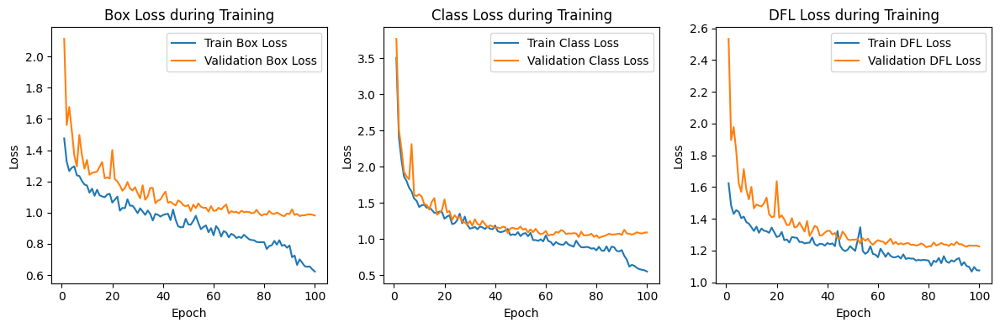

In [33]:
import pandas as pd
results_path = '/content/runs/detect/train2/results.csv'
df = pd.read_csv(results_path)

df.columns = df.columns.str.strip()
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.plot(df['epoch'], df['train/box_loss'], label='Train Box Loss')
plt.plot(df['epoch'], df['val/box_loss'], label='Validation Box Loss')
plt.title('Box Loss during Training')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(df['epoch'], df['train/cls_loss'], label='Train Class Loss')
plt.plot(df['epoch'], df['val/cls_loss'], label='Validation Class Loss')
plt.title('Class Loss during Training')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 3, 3)
plt.plot(df['epoch'], df['train/dfl_loss'], label='Train DFL Loss')
plt.plot(df['epoch'], df['val/dfl_loss'], label='Validation DFL Loss')
plt.title('DFL Loss during Training')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

### **Results Analysis for Adjusted Hyperparameters**

After switching to the **SGD optimizer** and using the default batch size, the following observations can be made:  

1. **Box Loss**:  
   - Training loss decreases steadily, but the validation loss plateaus around epoch 50, indicating potential underfitting or learning rate limitations.  

2. **Class Loss**:  
   - Training loss continues to improve, while the validation loss stabilizes at a higher value, suggesting challenges in generalizing the classification.  

3. **DFL Loss**:  
   - Both training and validation losses show consistent downward trends, though a slight gap remains.  

### **Conclusion**  
The **SGD optimizer** provides stable training but shows a noticeable gap between training and validation losses, particularly for box and class losses. Further tuning of the **learning rate** or **batch size** may help improve validation performance and close this gap.


## Trainin with **YOLOv11X**

The **YOLOv11x** model, a larger and more powerful variant, is trained with the same dataset and default (optimized) configuration:

In [34]:
from ultralytics import YOLO

model = YOLO('yolo11x.pt')

# Train the model
model.train(
    data='/content/Civil-Faults-Detection--1/data.yaml',
    epochs=100,
    imgsz=640,
)

100%|██████████| 109M/109M [00:00<00:00, 244MB/s] 


New https://pypi.org/project/ultralytics/8.3.51 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=yolo11x.pt, data=/content/Civil-Faults-Detection--1/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train4, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, emb

train: Scanning /content/Civil-Faults-Detection--1/train/labels.cache... 1505 images, 15 backgrounds, 0 corrupt: 100%|██████████| 1505/1505 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 1744, len(boxes) = 1791. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /content/Civil-Faults-Detection--1/valid/labels.cache... 422 images, 8 backgrounds, 0 corrupt: 100%|██████████| 422/422 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 503, len(boxes) = 511. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


Plotting labels to runs/detect/train4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000667, momentum=0.9) with parameter groups 167 weight(decay=0.0), 174 weight(decay=0.0005), 173 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train4
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      16.6G      1.569      3.005      1.759          2        640: 100%|██████████| 95/95 [00:27<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:23<00:00,  1.67s/it]

                   all        422        511      0.165     0.0163    0.00567    0.00233



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      16.8G      1.669      2.446      1.766          4        640: 100%|██████████| 95/95 [00:24<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.38it/s]

                   all        422        511      0.291     0.0462     0.0057    0.00183



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      16.6G      1.726      2.453      1.816          1        640: 100%|██████████| 95/95 [00:24<00:00,  3.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  3.95it/s]

                   all        422        511     0.0995      0.186     0.0854     0.0305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      16.8G      1.653      2.295      1.753          2        640: 100%|██████████| 95/95 [00:23<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  3.97it/s]

                   all        422        511      0.293      0.127     0.0736     0.0248



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      16.7G      1.558      2.219      1.665          0        640: 100%|██████████| 95/95 [00:23<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.50it/s]

                   all        422        511      0.534      0.357      0.292      0.139



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      16.8G        1.5      2.033      1.621          3        640: 100%|██████████| 95/95 [00:23<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.56it/s]

                   all        422        511      0.512      0.191      0.187     0.0874



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      16.6G      1.425      1.896      1.566          4        640: 100%|██████████| 95/95 [00:23<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.43it/s]

                   all        422        511      0.545      0.435      0.422      0.213



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      16.8G      1.441      1.884      1.583          1        640: 100%|██████████| 95/95 [00:23<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.51it/s]

                   all        422        511      0.591      0.529      0.539      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      16.7G      1.395      1.799       1.55          3        640: 100%|██████████| 95/95 [00:23<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.43it/s]

                   all        422        511      0.503      0.534      0.483      0.266



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      16.8G      1.371      1.836      1.535          4        640: 100%|██████████| 95/95 [00:23<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.43it/s]

                   all        422        511      0.726      0.411      0.506      0.272



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      16.6G      1.317      1.738      1.495          3        640: 100%|██████████| 95/95 [00:23<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.42it/s]

                   all        422        511      0.487      0.537      0.496      0.273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      16.7G      1.304      1.652      1.472          2        640: 100%|██████████| 95/95 [00:23<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.56it/s]

                   all        422        511      0.643      0.441      0.474      0.243



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      16.7G      1.307      1.644       1.48          1        640: 100%|██████████| 95/95 [00:23<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.56it/s]

                   all        422        511      0.613        0.5      0.528      0.325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      16.8G      1.315      1.656      1.471          3        640: 100%|██████████| 95/95 [00:23<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.47it/s]

                   all        422        511      0.606       0.59      0.594      0.358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      16.6G      1.281      1.616       1.46          3        640: 100%|██████████| 95/95 [00:23<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.51it/s]

                   all        422        511      0.665      0.515      0.573      0.354



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      16.8G      1.229      1.563      1.442          4        640: 100%|██████████| 95/95 [00:23<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.44it/s]

                   all        422        511       0.57      0.569      0.561      0.319



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      16.8G      1.204      1.527      1.441          5        640: 100%|██████████| 95/95 [00:23<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.56it/s]

                   all        422        511      0.651      0.568      0.579      0.354



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      16.8G      1.207      1.556      1.428          2        640: 100%|██████████| 95/95 [00:23<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.53it/s]

                   all        422        511      0.671      0.571      0.611      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      16.6G      1.209      1.526      1.443          1        640: 100%|██████████| 95/95 [00:23<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.59it/s]

                   all        422        511      0.629      0.581      0.611      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      16.7G       1.17      1.489      1.386          4        640: 100%|██████████| 95/95 [00:23<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.55it/s]

                   all        422        511      0.666      0.617      0.627      0.387



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      16.8G      1.166      1.484      1.391          1        640: 100%|██████████| 95/95 [00:23<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.48it/s]

                   all        422        511      0.697      0.586      0.625      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      16.8G      1.142      1.462      1.386          5        640: 100%|██████████| 95/95 [00:23<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.52it/s]

                   all        422        511      0.643      0.597       0.64      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      16.6G      1.164      1.445      1.394          1        640: 100%|██████████| 95/95 [00:23<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.56it/s]

                   all        422        511      0.629      0.633      0.639      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      16.8G      1.147      1.448      1.374          4        640: 100%|██████████| 95/95 [00:23<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.58it/s]

                   all        422        511      0.685      0.576      0.617      0.388



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      16.7G       1.17      1.447      1.379          6        640: 100%|██████████| 95/95 [00:23<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.64it/s]

                   all        422        511      0.624      0.679      0.682      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      16.8G      1.124      1.422       1.36          2        640: 100%|██████████| 95/95 [00:23<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.59it/s]

                   all        422        511      0.695      0.643      0.679      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      16.6G      1.122        1.4      1.349          4        640: 100%|██████████| 95/95 [00:23<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.59it/s]

                   all        422        511      0.661      0.614      0.612      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      16.8G      1.113       1.37      1.334          1        640: 100%|██████████| 95/95 [00:23<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.56it/s]

                   all        422        511      0.648      0.628      0.656      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      16.7G       1.12      1.395      1.336          2        640: 100%|██████████| 95/95 [00:23<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.54it/s]

                   all        422        511       0.65       0.63      0.642      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      16.8G      1.089      1.339      1.339          4        640: 100%|██████████| 95/95 [00:23<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.52it/s]

                   all        422        511      0.636      0.663      0.666      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      16.6G      1.105      1.306       1.34          4        640: 100%|██████████| 95/95 [00:23<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.60it/s]

                   all        422        511      0.705       0.61       0.66      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      16.7G      1.065      1.323      1.311          2        640: 100%|██████████| 95/95 [00:23<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.59it/s]

                   all        422        511      0.693      0.648      0.687      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      16.7G      1.065      1.303      1.315          1        640: 100%|██████████| 95/95 [00:23<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.57it/s]

                   all        422        511      0.688      0.626      0.658      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      16.8G      1.098      1.344      1.347          1        640: 100%|██████████| 95/95 [00:23<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.61it/s]

                   all        422        511      0.611      0.652      0.634      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      16.6G      1.071      1.324      1.318          1        640: 100%|██████████| 95/95 [00:23<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.45it/s]

                   all        422        511      0.684      0.636      0.669      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      16.7G      1.056      1.316      1.321          1        640: 100%|██████████| 95/95 [00:23<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.47it/s]

                   all        422        511      0.683      0.636      0.668      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      16.8G      1.045      1.287      1.311          4        640: 100%|██████████| 95/95 [00:23<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.55it/s]

                   all        422        511      0.676      0.634      0.661      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      16.7G      1.047      1.269      1.304          2        640: 100%|██████████| 95/95 [00:23<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.61it/s]

                   all        422        511       0.72      0.683      0.696      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      16.6G      1.049      1.244      1.303          2        640: 100%|██████████| 95/95 [00:23<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.61it/s]

                   all        422        511       0.65       0.65      0.667      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      16.8G      1.049      1.283      1.308          3        640: 100%|██████████| 95/95 [00:23<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.50it/s]

                   all        422        511      0.707       0.63      0.664      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      16.7G      1.057      1.274      1.313          4        640: 100%|██████████| 95/95 [00:23<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.51it/s]

                   all        422        511      0.725      0.637      0.688      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      16.8G      1.039      1.226      1.301          1        640: 100%|██████████| 95/95 [00:23<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.59it/s]

                   all        422        511      0.719      0.645      0.691      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      16.6G      1.026      1.235      1.296          2        640: 100%|██████████| 95/95 [00:23<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.57it/s]

                   all        422        511      0.675      0.685      0.695      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      16.8G      1.026      1.223      1.292          4        640: 100%|██████████| 95/95 [00:23<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.64it/s]

                   all        422        511       0.66      0.704      0.684      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      16.7G      1.016      1.253      1.291          2        640: 100%|██████████| 95/95 [00:23<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.63it/s]

                   all        422        511      0.678      0.659      0.691      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      16.8G      1.024      1.226      1.302          3        640: 100%|██████████| 95/95 [00:23<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.61it/s]

                   all        422        511      0.721      0.681      0.716      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      16.6G      1.003      1.214      1.279          3        640: 100%|██████████| 95/95 [00:23<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.58it/s]

                   all        422        511       0.69      0.662      0.703       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      16.8G      1.008       1.23      1.284          2        640: 100%|██████████| 95/95 [00:23<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.58it/s]

                   all        422        511      0.721      0.627      0.672      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      16.7G      1.002      1.217      1.286          4        640: 100%|██████████| 95/95 [00:23<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.59it/s]

                   all        422        511      0.666      0.681      0.698      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      16.8G      0.999      1.216      1.279          1        640: 100%|██████████| 95/95 [00:23<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.59it/s]

                   all        422        511      0.704      0.674      0.691      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      16.5G     0.9676       1.15      1.254          3        640: 100%|██████████| 95/95 [00:23<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.63it/s]

                   all        422        511       0.71      0.675      0.707      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      16.8G     0.9664      1.166      1.251          0        640: 100%|██████████| 95/95 [00:23<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.60it/s]

                   all        422        511      0.761      0.628        0.7      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      16.8G      1.009      1.241      1.294          1        640: 100%|██████████| 95/95 [00:23<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.57it/s]

                   all        422        511      0.706      0.717      0.721      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      16.8G     0.9966      1.199      1.271          1        640: 100%|██████████| 95/95 [00:23<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.56it/s]

                   all        422        511      0.695      0.676      0.701      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      16.6G     0.9769      1.146      1.258          2        640: 100%|██████████| 95/95 [00:23<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.58it/s]

                   all        422        511      0.731      0.663      0.706      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      16.8G     0.9694      1.122      1.254          2        640: 100%|██████████| 95/95 [00:23<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.63it/s]

                   all        422        511      0.712      0.686      0.704      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      16.7G      0.968      1.143       1.25          4        640: 100%|██████████| 95/95 [00:23<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.57it/s]

                   all        422        511      0.712      0.694       0.71      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      16.8G     0.9364      1.127      1.241          8        640: 100%|██████████| 95/95 [00:23<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.54it/s]

                   all        422        511       0.67      0.695      0.695      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      16.6G     0.9511      1.143      1.254          3        640: 100%|██████████| 95/95 [00:23<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.64it/s]

                   all        422        511      0.758      0.644      0.715      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      16.7G     0.9393      1.131      1.243          2        640: 100%|██████████| 95/95 [00:23<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.56it/s]

                   all        422        511      0.689      0.686      0.716      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      16.8G     0.9643      1.122       1.25          1        640: 100%|██████████| 95/95 [00:23<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.49it/s]

                   all        422        511      0.718      0.687      0.707      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      16.8G      0.918      1.085      1.221          3        640: 100%|██████████| 95/95 [00:23<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.47it/s]

                   all        422        511      0.707      0.689      0.723      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      16.6G     0.9055      1.063      1.212          4        640: 100%|██████████| 95/95 [00:23<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.58it/s]

                   all        422        511      0.749      0.663      0.714      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      16.8G     0.9628      1.114      1.252          1        640: 100%|██████████| 95/95 [00:23<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.60it/s]

                   all        422        511      0.739      0.679      0.706      0.503



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      16.7G     0.9479      1.079      1.244          2        640: 100%|██████████| 95/95 [00:23<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.64it/s]

                   all        422        511       0.78      0.656       0.71      0.499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      16.8G     0.9245      1.111      1.241          3        640: 100%|██████████| 95/95 [00:23<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.61it/s]

                   all        422        511       0.76      0.674      0.731      0.518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      16.5G     0.9314      1.108      1.233          2        640: 100%|██████████| 95/95 [00:23<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.60it/s]

                   all        422        511      0.677      0.688      0.717      0.501



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      16.8G     0.9083      1.075      1.226          1        640: 100%|██████████| 95/95 [00:23<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.56it/s]

                   all        422        511      0.702      0.707      0.723       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      16.8G     0.9377      1.065      1.239          2        640: 100%|██████████| 95/95 [00:23<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.62it/s]

                   all        422        511      0.768      0.697      0.738      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      16.8G     0.9489      1.118      1.261          1        640: 100%|██████████| 95/95 [00:23<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.62it/s]

                   all        422        511      0.718        0.7      0.733      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      16.6G     0.9491      1.046      1.263          1        640: 100%|██████████| 95/95 [00:23<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.54it/s]

                   all        422        511      0.696        0.7      0.718      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      16.8G     0.9034      1.058      1.212          3        640: 100%|██████████| 95/95 [00:23<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.62it/s]

                   all        422        511      0.688      0.704      0.721      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      16.7G     0.9071      1.072       1.21          3        640: 100%|██████████| 95/95 [00:23<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.60it/s]

                   all        422        511      0.808      0.649      0.728      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      16.8G     0.8866       1.05      1.204          3        640: 100%|██████████| 95/95 [00:23<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.64it/s]

                   all        422        511      0.711        0.7      0.713      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      16.6G     0.9042      1.076      1.212          1        640: 100%|██████████| 95/95 [00:23<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.60it/s]

                   all        422        511      0.749      0.669       0.72      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      16.8G     0.8868      1.028      1.214          3        640: 100%|██████████| 95/95 [00:23<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.63it/s]

                   all        422        511      0.777       0.67      0.739      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      16.7G     0.8752      1.014      1.193          3        640: 100%|██████████| 95/95 [00:23<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.58it/s]

                   all        422        511      0.735      0.668      0.708      0.505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      16.8G     0.8788      1.031      1.199          4        640: 100%|██████████| 95/95 [00:23<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.61it/s]

                   all        422        511      0.772      0.639      0.723      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      16.6G     0.8664      1.027      1.189          2        640: 100%|██████████| 95/95 [00:23<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.65it/s]

                   all        422        511      0.777      0.642      0.708      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      16.8G     0.8477     0.9835      1.195          3        640: 100%|██████████| 95/95 [00:23<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.60it/s]

                   all        422        511      0.701      0.682      0.707      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      16.7G     0.8813      1.037      1.191          1        640: 100%|██████████| 95/95 [00:23<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.59it/s]

                   all        422        511      0.733      0.679      0.712      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      16.8G     0.8613      1.009      1.187          5        640: 100%|██████████| 95/95 [00:23<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.54it/s]

                   all        422        511       0.68      0.734      0.717      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      16.6G      0.853     0.9954       1.19          2        640: 100%|██████████| 95/95 [00:23<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.58it/s]

                   all        422        511      0.755      0.665      0.717      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      16.7G     0.8522       0.98      1.189          8        640: 100%|██████████| 95/95 [00:23<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.65it/s]

                   all        422        511      0.708      0.708      0.714      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      16.7G     0.8653      1.003      1.193          2        640: 100%|██████████| 95/95 [00:23<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.59it/s]

                   all        422        511      0.693      0.702      0.719      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      16.8G     0.8587      1.011      1.188          3        640: 100%|██████████| 95/95 [00:23<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:02<00:00,  4.67it/s]

                   all        422        511      0.723      0.698      0.721      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      16.5G     0.8491       0.97      1.193          4        640: 100%|██████████| 95/95 [00:23<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.56it/s]

                   all        422        511      0.771      0.665      0.717      0.517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      16.8G     0.8292     0.9558      1.174          1        640: 100%|██████████| 95/95 [00:23<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.62it/s]

                   all        422        511      0.741      0.684      0.718      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      16.7G     0.8268     0.9508      1.169          2        640: 100%|██████████| 95/95 [00:23<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.60it/s]

                   all        422        511      0.745      0.691      0.725      0.516



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      16.8G     0.8395     0.9636      1.177          3        640: 100%|██████████| 95/95 [00:23<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.62it/s]

                   all        422        511      0.713      0.717      0.719      0.518


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      16.6G     0.7627     0.7703      1.185          1        640: 100%|██████████| 95/95 [00:24<00:00,  3.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.53it/s]

                   all        422        511      0.716      0.668      0.689      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      16.8G      0.748     0.7468      1.174          1        640: 100%|██████████| 95/95 [00:23<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.57it/s]

                   all        422        511      0.716      0.702      0.714      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      16.7G     0.7221     0.7239      1.147          1        640: 100%|██████████| 95/95 [00:23<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.60it/s]

                   all        422        511      0.731      0.684      0.709      0.505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      16.8G     0.6962     0.6766       1.12          1        640: 100%|██████████| 95/95 [00:23<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.58it/s]

                   all        422        511      0.717      0.707      0.713      0.512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      16.5G     0.7219     0.6809      1.154          2        640: 100%|██████████| 95/95 [00:23<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.62it/s]

                   all        422        511      0.715      0.721      0.717      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      16.8G     0.6891     0.6812      1.126          1        640: 100%|██████████| 95/95 [00:23<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.57it/s]

                   all        422        511      0.717      0.702       0.71       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      16.7G     0.6868     0.6692      1.126          1        640: 100%|██████████| 95/95 [00:23<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.59it/s]

                   all        422        511      0.727      0.695       0.71      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      16.8G     0.6975      0.662      1.124          1        640: 100%|██████████| 95/95 [00:23<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.63it/s]

                   all        422        511      0.716      0.721       0.71      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      16.6G     0.6774     0.6434      1.117          1        640: 100%|██████████| 95/95 [00:23<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.60it/s]

                   all        422        511       0.73      0.703      0.713      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      16.8G     0.6851     0.6412      1.123          1        640: 100%|██████████| 95/95 [00:23<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  4.61it/s]

                   all        422        511      0.727      0.712      0.715      0.515



100 epochs completed in 0.816 hours.
Optimizer stripped from runs/detect/train4/weights/last.pt, 114.4MB
Optimizer stripped from runs/detect/train4/weights/best.pt, 114.4MB

Validating runs/detect/train4/weights/best.pt...
Ultralytics 8.3.40 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
YOLO11x summary (fused): 464 layers, 56,839,729 parameters, 0 gradients, 194.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 14/14 [00:03<00:00,  3.73it/s]


                   all        422        511      0.717        0.7      0.733      0.521
   Diagonal_Fine_Crack         68         69      0.777      0.858      0.864      0.695
 Diagonal_Medium_Crack         42         50      0.731       0.58      0.721      0.577
 Diagonal_Severe_Crack         78         78      0.889      0.923      0.914      0.836
 Horizontal_Fine_Crack         31         37      0.659      0.595       0.63       0.34
Horizontal_Medium_Crack         15         18      0.633      0.575      0.597      0.394
Horizontal_Severe_Crack         50         51      0.795      0.922      0.866      0.643
        Pavement_Crack         12         44      0.594      0.731      0.725      0.394
           Tile_Damage         27         32       0.79      0.781      0.834      0.497
   Vertical_Fine_Crack         37         52      0.515      0.462      0.498       0.28
 Vertical_Medium_Crack         24         32      0.687      0.312      0.456      0.289
 Vertical_Severe_Cr

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7ab20428cbb0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.

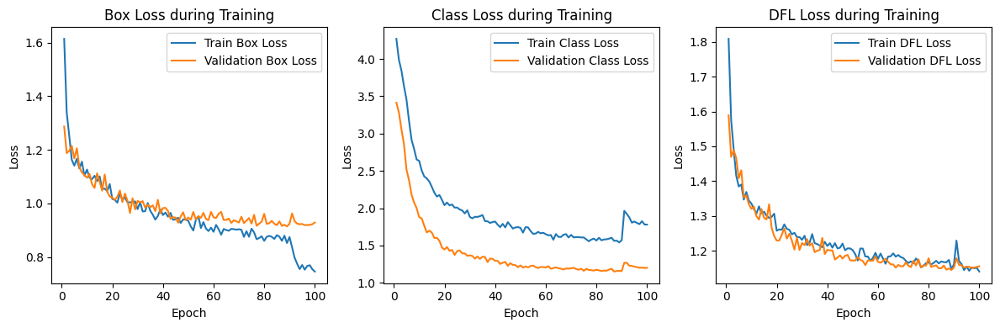

In [35]:
import pandas as pd
results_path = '/content/runs/detect/train3/results.csv'
df = pd.read_csv(results_path)

df.columns = df.columns.str.strip()
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.plot(df['epoch'], df['train/box_loss'], label='Train Box Loss')
plt.plot(df['epoch'], df['val/box_loss'], label='Validation Box Loss')
plt.title('Box Loss during Training')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(df['epoch'], df['train/cls_loss'], label='Train Class Loss')
plt.plot(df['epoch'], df['val/cls_loss'], label='Validation Class Loss')
plt.title('Class Loss during Training')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 3, 3)
plt.plot(df['epoch'], df['train/dfl_loss'], label='Train DFL Loss')
plt.plot(df['epoch'], df['val/dfl_loss'], label='Validation DFL Loss')
plt.title('DFL Loss during Training')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

### **Results Analysis for YOLOv11x Model**

1. **Box Loss**:  
   - Training loss decreases steadily, while validation loss stabilizes early, showing minor overfitting.  

2. **Class Loss**:  
   - A clear gap between training and validation losses indicates better generalization but suggests the model may still underfit slightly.  

3. **DFL Loss**:  
   - Both training and validation DFL losses converge closely, reflecting improved bounding box precision.  

### **Conclusion**  
The **YOLOv11x** model reduces losses significantly, showing improved performance over smaller models. However, the slight gap in class loss suggests the need for further fine-tuning or additional data augmentation to fully leverage its capacity.


Results saved to results/predictions2


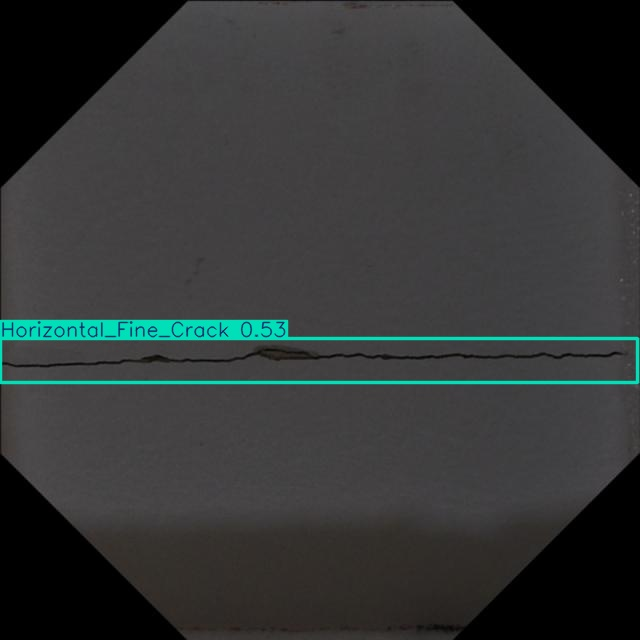

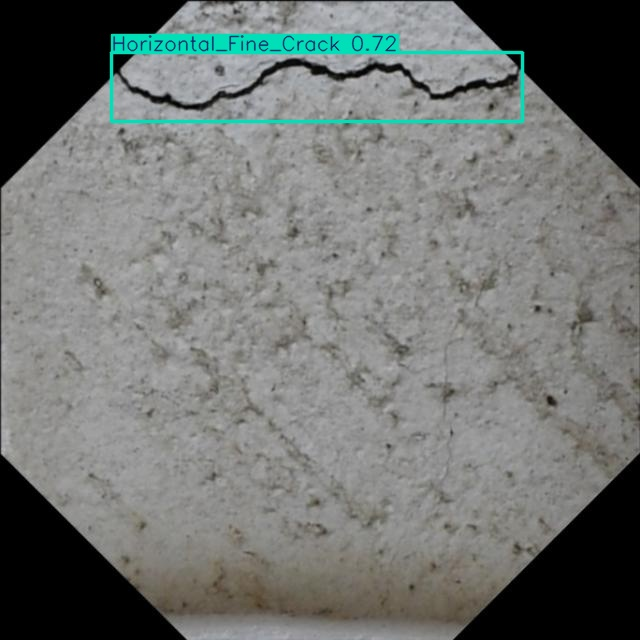

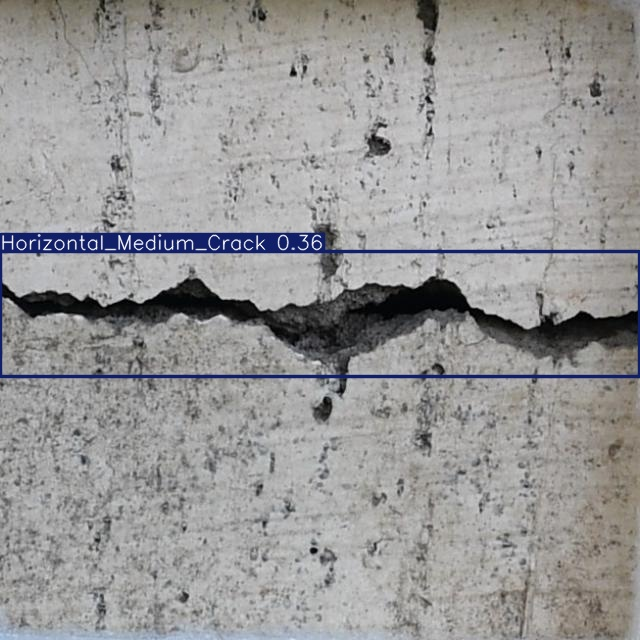

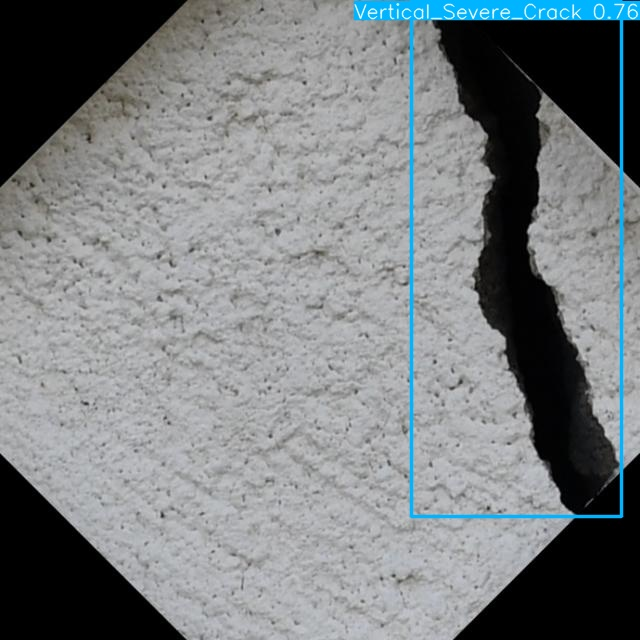

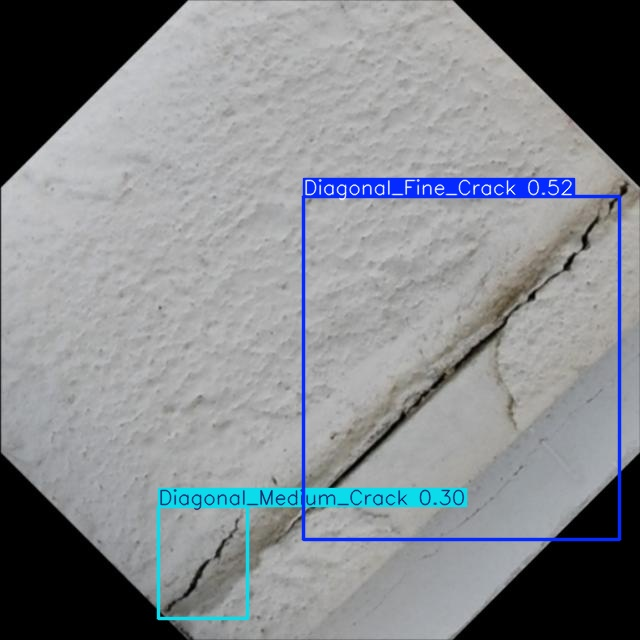

In [36]:
# Load the trained YOLO model
model_path = "/content/runs/detect/train3/weights/best.pt"
model = YOLO(model_path)

# Run prediction
results = model.predict(
    source="/content/Civil-Faults-Detection--1/test/images",
    conf=0.25,
    save=True,
    project="results",
    name="predictions",
    verbose=False
    )

import glob
import os
from IPython.display import Image as IPyImage, display

latest_folder = "/content/results/predictions"

if os.path.exists(latest_folder):
    image_files = glob.glob(f"{latest_folder}/*.jpg")
    if image_files:
        # Display up to 5 predicted images
        for img in image_files[:5]:
            display(IPyImage(filename=img, width=300))
            print("\n")
    else:
        print("No images found in the predictions folder.")
else:
    print("Predictions folder does not exist. Check the path.")

## **Overall Conclusion**

This project explored crack detection and classification in civil infrastructure using the YOLOv11 family of models. Various models, including **YOLOv11n** (nano) and **YOLOv11x** (extra-large), were trained, evaluated, and compared under different hyperparameter settings.

1. **Model Performance**:  
   - **YOLOv11n**: Lightweight and fast, achieving decent mAP scores but showing higher validation losses, indicating limitations in complex feature learning.  
   - **YOLOv11x**: Larger capacity significantly improved performance, reducing all loss metrics and achieving better mAP and generalization, though requiring more computational resources.  

2. **Hyperparameter Adjustments**:  
   - Lowering the learning rate, increasing the batch size, and experimenting with **AdamW** and **SGD** optimizers led to improved stability and convergence.  

3. **Key Observations**:  
   - **Loss Trends**: Steady reductions in box, class, and DFL losses across models, with validation losses stabilizing as training progressed.  
   - **Precision and Recall**: Both metrics improved over epochs, with the larger model (YOLOv11x) achieving the best overall performance.  
   - **Class-specific Performance**: Certain classes, like **Diagonal_Severe_Crack** and **Vertical_Severe_Crack**, achieved higher mAP scores, while others, like **Horizontal_Medium_Crack**, remained challenging.  

### **Final Remarks**  
The results highlight the trade-offs between model size, performance, and resource requirements. **YOLOv11x** is recommended for scenarios demanding high accuracy, while **YOLOv11n** remains a strong choice for real-time applications with limited computational resources. Future improvements can focus on class balancing, enhanced augmentations, and further hyperparameter optimization to address underperforming crack categories.


## **References**

1. Roboflow. "Train YOLOv11 Object Detection on Custom Dataset."  
   [https://colab.research.google.com/github/roboflow-ai/notebooks/blob/main/notebooks/train-yolo11-object-detection-on-custom-dataset.ipynb#scrollTo=1nOnTQynZfeA](https://colab.research.google.com/github/roboflow-ai/notebooks/blob/main/notebooks/train-yolo11-object-detection-on-custom-dataset.ipynb#scrollTo=1nOnTQynZfeA)  

2. Ultralytics Documentation. "YOLOv11: Supported Tasks and Modes."  
   [https://docs.ultralytics.com/models/yolo11/#supported-tasks-and-modes](https://docs.ultralytics.com/models/yolo11/#supported-tasks-and-modes)  

3. Rao, Nikhil. "YOLOv11 Explained: Next-Level Object Detection with Enhanced Speed and Accuracy." Medium, 2024.  
   [https://medium.com/@nikhil-rao-20/yolov11-explained-next-level-object-detection-with-enhanced-speed-and-accuracy-2dbe2d376f71](https://medium.com/@nikhil-rao-20/yolov11-explained-next-level-object-detection-with-enhanced-speed-and-accuracy-2dbe2d376f71)  

4. Ultralytics GitHub Repository. "Ultralytics YOLOv11 - Open-Source Object Detection Models."  
   [https://github.com/ultralytics/ultralytics](https://github.com/ultralytics/ultralytics)  

5. Roboflow Dataset: Civil Fault Detection.  
   [https://universe.roboflow.com/iiti/civil-faults-detection/dataset/1](https://universe.roboflow.com/iiti/civil-faults-detection/dataset/1)  

6. Google Drive. "YOLOv11 Architecture Diagram."  
   [https://drive.google.com/file/d/16ZGU2tuJyyrRDUh2KTYhlgnBAerdJz3V/view](https://drive.google.com/file/d/16ZGU2tuJyyrRDUh2KTYhlgnBAerdJz3V/view)  

7. Ultralytics PyPI Release Notes.  
   [https://pypi.org/project/ultralytics/](https://pypi.org/project/ultralytics/)  

8. TensorFlow Hub: "Object Detection Models and Performance Metrics."  
   [https://tfhub.dev](https://tfhub.dev)  
